<a href="https://colab.research.google.com/github/RoloNatt/Road-Traffic-Severity-Classification/blob/main/road_traffic_severity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [46]:
import numpy as np
import pandas as pd
import random

import warnings
warnings.filterwarnings('ignore')

!pip install autoviz
# autoviz library - Automatically Visualize any dataset, any size with a single line of code.
from autoviz.AutoViz_Class import AutoViz_Class

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [47]:
filename = "RTA Dataset.csv"
df = pd.read_csv(filename)
df

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,No defect,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,No defect,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,No defect,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,No defect,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,No defect,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,16:15:00,Wednesday,31-50,Male,NaN,Employee,2-5yr,Lorry (11?40Q),Owner,NaN,No defect,Outside rural areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Going straight,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12312,18:00:00,Sunday,Unknown,Male,Elementary school,Employee,5-10yr,Automobile,Owner,NaN,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Escarpments,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
12313,13:55:00,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,2-5yrs,No defect,Outside rural areas,Two-way (divided with broken lines road marking),Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,1,1,Other,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Serious Injury
12314,13:55:00,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,2-5yrs,No defect,Office areas,Undivided Two way,Tangent road with mountainous terrain and,No junction,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,1,Other,na,na,na,na,Driver,Normal,Not a Pedestrian,Driving under the influence of drugs,Slight Injury


Shape of your Data Set loaded: (12316, 32)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    32 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
2 numeric variables in data exceeds limit, taking top 32 variables
    List of variables selected: ['Number_of_vehicles_involved', 'Number_of_casualties']
   Total columns > 30, too numerous to print.
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,nan,nan,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,nan,nan,No issue
Age_band_of_driver,object,0.000000,0,nan,nan,No issue
Sex_of_driver,object,0.000000,0,nan,nan,No issue
Educational_level,object,6.016564,0,nan,nan,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,nan,nan,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,nan,nan,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,nan,nan,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,nan,nan,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,nan,nan,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


Number of All Scatter Plots = 3


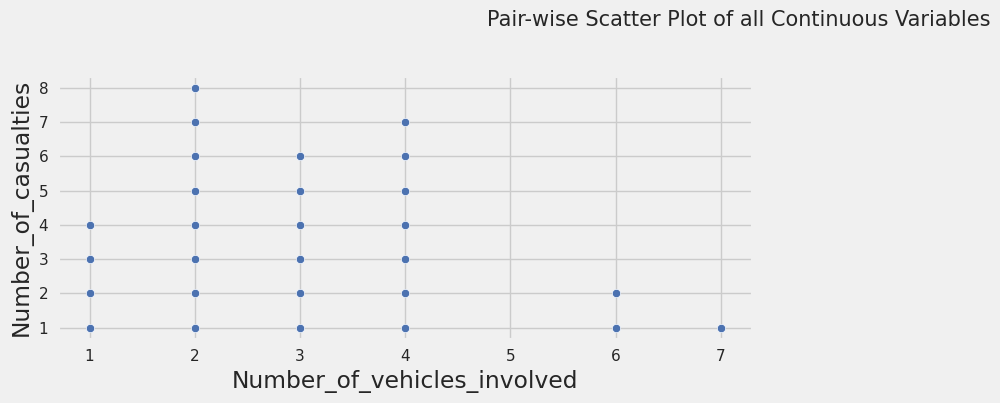

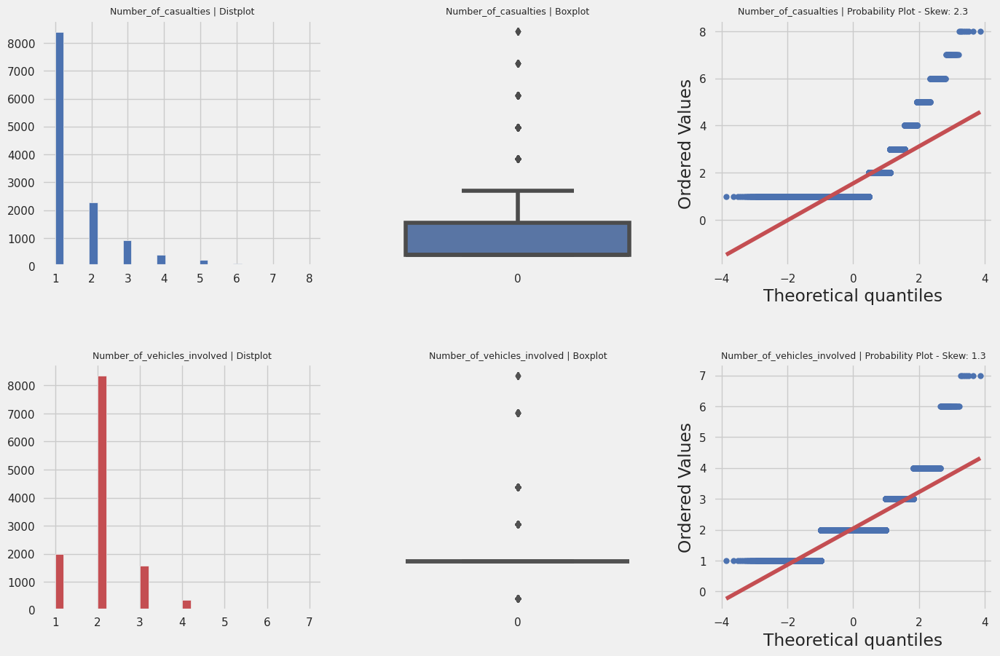

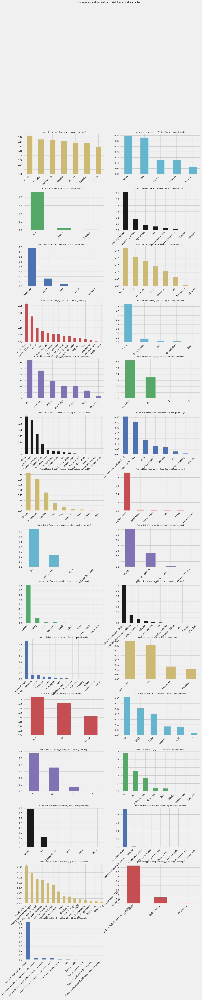

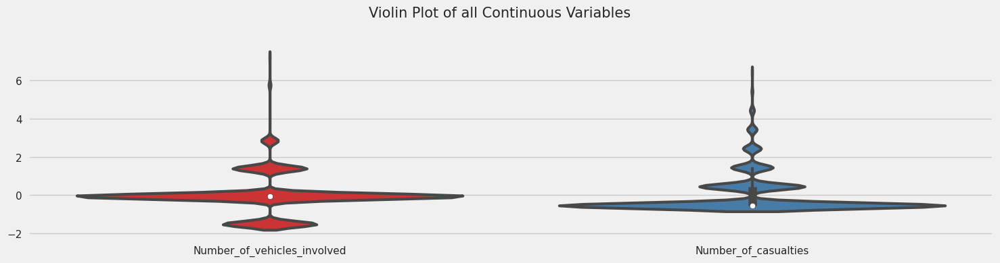

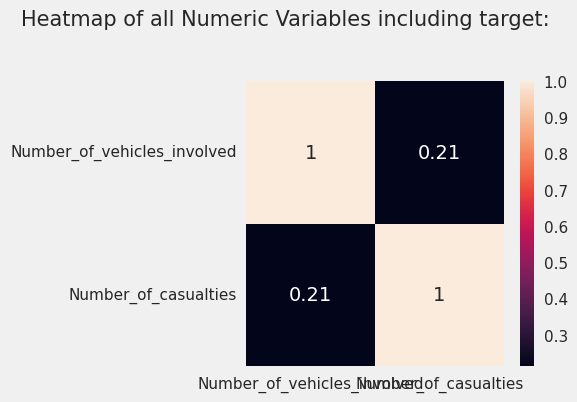

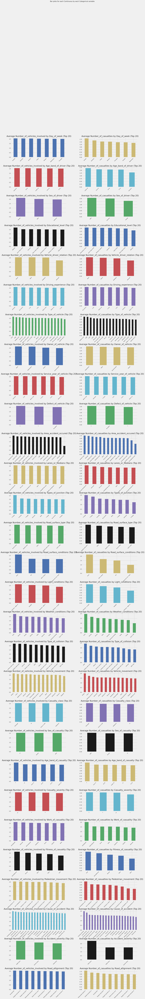

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Time
All Plots done
Time to run AutoViz = 51 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


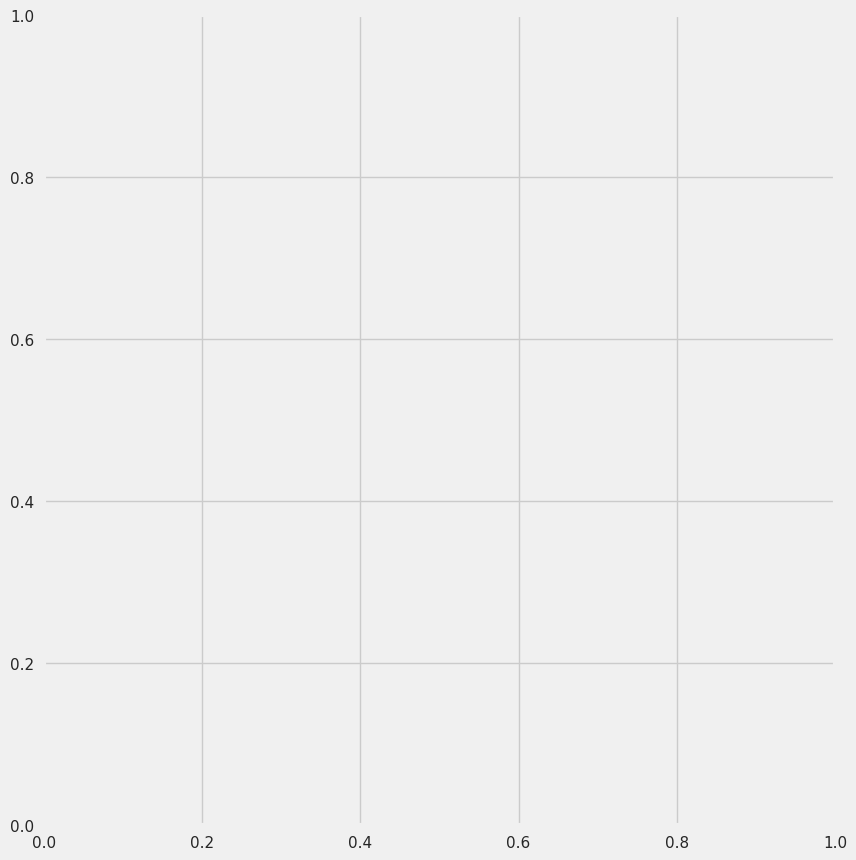

In [48]:
AV = AutoViz_Class()

%matplotlib inline

dft = AV.AutoViz(
    filename="",                # give file name if no dfte(dataframe)
    sep=",",
    depVar="",                  # target variable (optional)
    dfte=df,                    # dataframe (empty if you use filename)
    header=0,                   # row number of the header
    verbose=1,                  # 0,1,2 (0 - all charts, less info; 1 - all charts, more info, 2 - all charts saved in folder)
    lowess=False,               # to see regression lines (don't use for large data sets,i., >100,000 rows))
    chart_format="svg",         # 'svg', 'png', 'jpg', 'bokeh', 'server', 'html' (bokeh - to get interactive charts in jupyter notebook, server - to get interactive charts in browser)
    max_rows_analyzed=15000,
    max_cols_analyzed=32,
    save_plot_dir=None           # directory to save plots in (None - default folder)
)


In [49]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(df)

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,nan,nan,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,nan,nan,No issue
Age_band_of_driver,object,0.000000,0,nan,nan,No issue
Sex_of_driver,object,0.000000,0,nan,nan,No issue
Educational_level,object,6.016564,0,nan,nan,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,nan,nan,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,nan,nan,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,nan,nan,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,nan,nan,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,nan,nan,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,NaN,NaN,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,NaN,NaN,No issue
Age_band_of_driver,object,0.000000,0,NaN,NaN,No issue
Sex_of_driver,object,0.000000,0,NaN,NaN,No issue
Educational_level,object,6.016564,0,NaN,NaN,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,NaN,NaN,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,NaN,NaN,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,NaN,NaN,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,NaN,NaN,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,NaN,NaN,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


Shape of your Data Set loaded: (12316, 32)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  29
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    32 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 12316 exceeds maximum, randomly sampling 12316 rows for EDA...

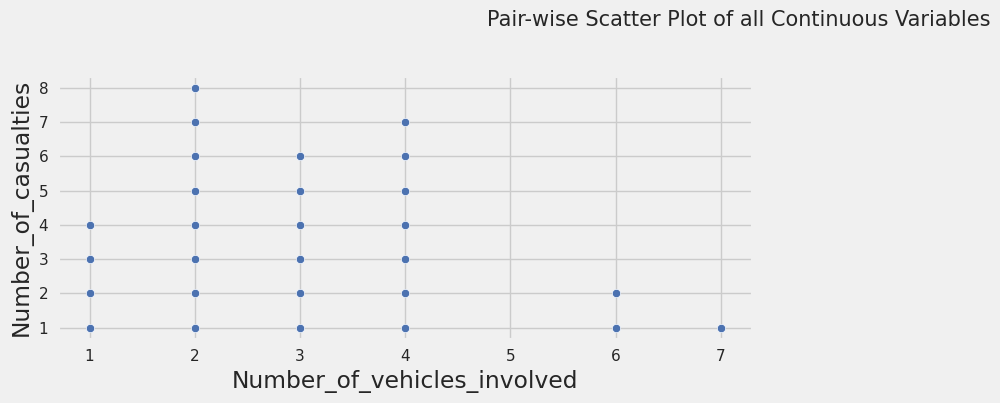

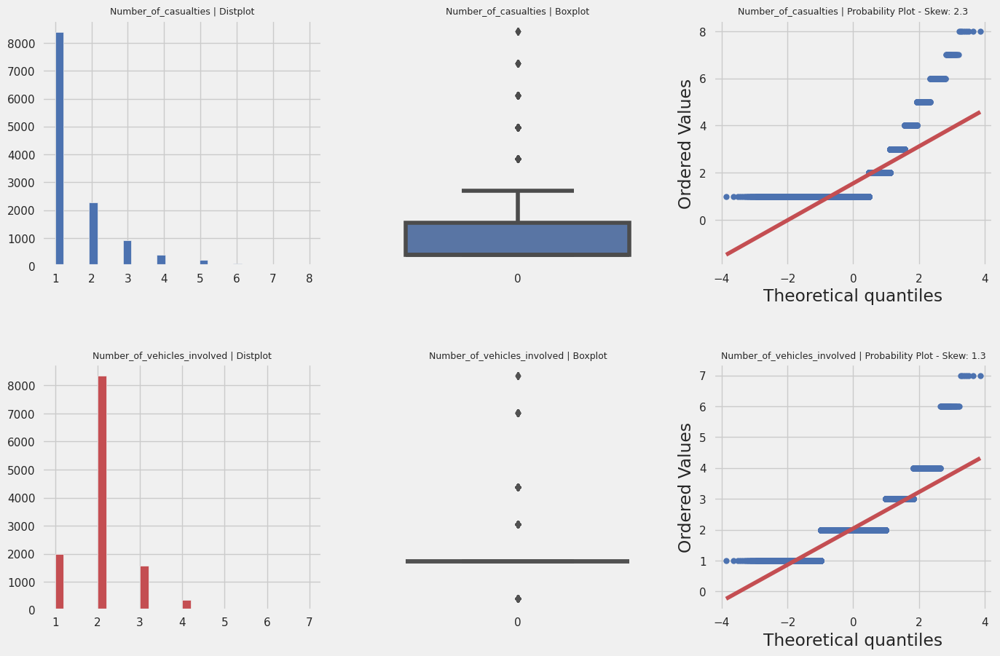

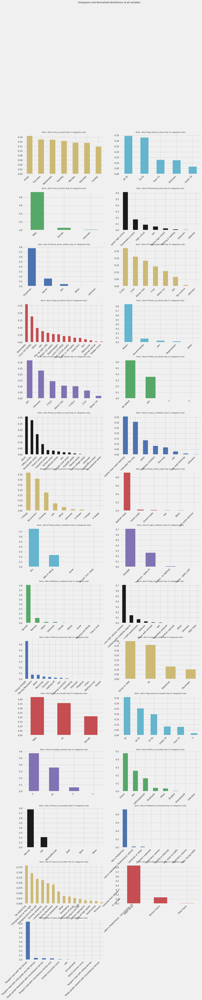

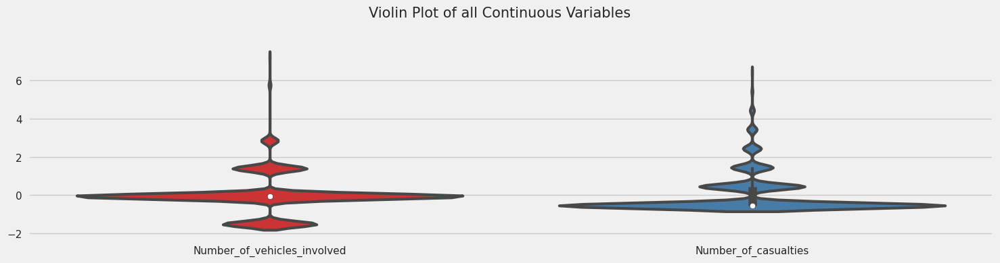

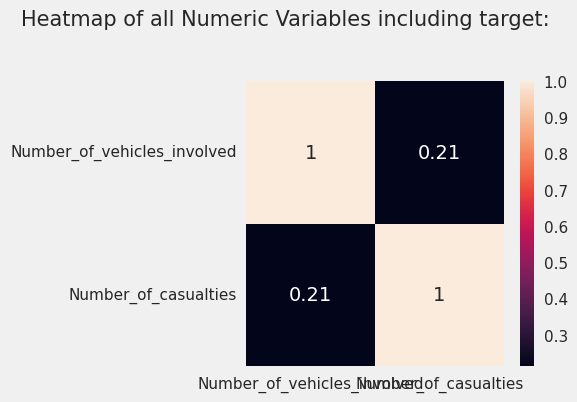

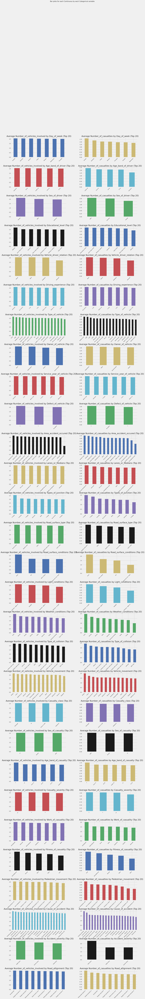

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Time
All Plots done
Time to run AutoViz = 50 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


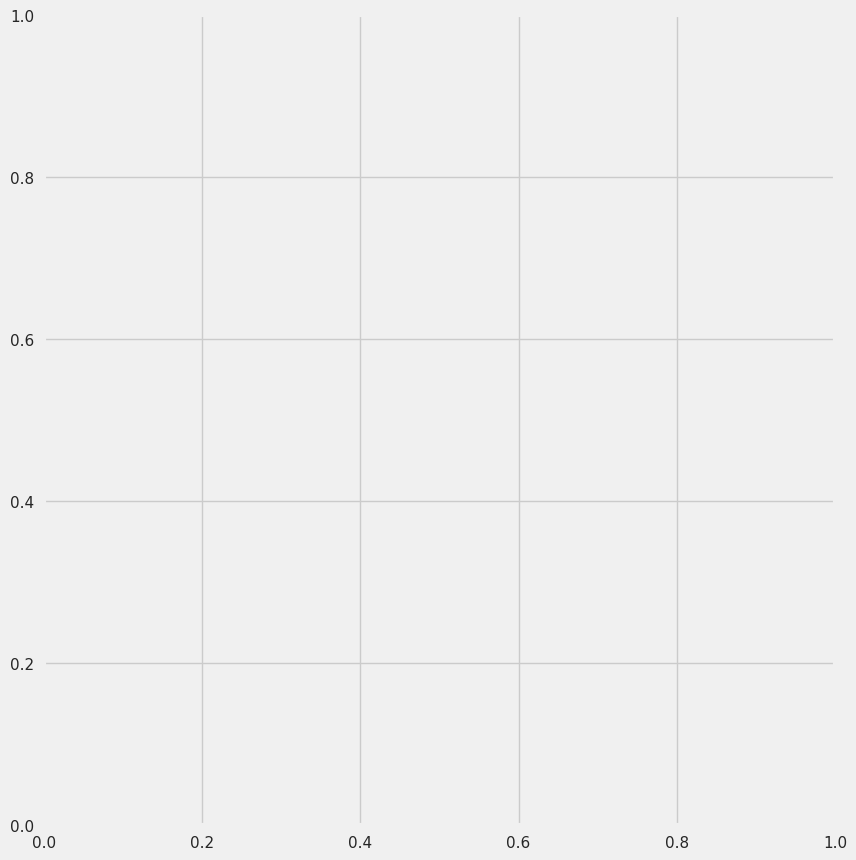

In [50]:
dft = AV.AutoViz(
    filename="",                # give file name if no dfte(dataframe)
    sep=",",
    depVar="",                  # target variable (optional)
    dfte=df,                    # dataframe (empty if you use filename)
    header=0,                   # row number of the header
    verbose=0,                  # 0,1,2 (0 - all charts, less info; 1 - all charts, more info, 2 - all charts saved in folder)
    lowess=False,               # to see regression lines (don't use for large data sets,i., >100,000 rows))
    chart_format="svg",         # 'svg', 'png', 'jpg', 'bokeh', 'server', 'html' (bokeh - to get interactive charts in jupyter notebook, server - to get interactive charts in browser)
    max_rows_analyzed=12316,
    max_cols_analyzed=32,
    save_plot_dir=None           # directory to save plots in (None - default folder)
)

In [51]:
data_cleaning_suggestions(df)

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,nan,nan,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,nan,nan,No issue
Age_band_of_driver,object,0.000000,0,nan,nan,No issue
Sex_of_driver,object,0.000000,0,nan,nan,No issue
Educational_level,object,6.016564,0,nan,nan,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,nan,nan,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,nan,nan,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,nan,nan,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,nan,nan,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,nan,nan,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Time,object,0.000000,8,NaN,NaN,"1074 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 1074 unique values: Use hash encoding or embedding to reduce dimension."
Day_of_week,object,0.000000,0,NaN,NaN,No issue
Age_band_of_driver,object,0.000000,0,NaN,NaN,No issue
Sex_of_driver,object,0.000000,0,NaN,NaN,No issue
Educational_level,object,6.016564,0,NaN,NaN,"741 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: ['Unknown', 'Illiterate']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Vehicle_driver_relation,object,4.701202,0,NaN,NaN,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Driving_experience,object,6.731082,0,NaN,NaN,"829 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['unknown']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Type_of_vehicle,object,7.713543,0,NaN,NaN,"950 missing values. Impute them with mean, median, mode, or a constant value such as 123., 5 rare categories: ['Special vehicle', 'Ridden horse', 'Turbo', 'Bajaj', 'Bicycle']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Owner_of_vehicle,object,3.913608,0,NaN,NaN,"482 missing values. Impute them with mean, median, mode, or a constant value such as 123., 1 rare categories: ['Other']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: object, float,"
Service_year_of_vehicle,object,31.893472,0,NaN,NaN,"3928 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,"


In [52]:
df.nunique()

Time                           1074
Day_of_week                       7
Age_band_of_driver                5
Sex_of_driver                     3
Educational_level                 7
Vehicle_driver_relation           4
Driving_experience                7
Type_of_vehicle                  17
Owner_of_vehicle                  4
Service_year_of_vehicle           6
Defect_of_vehicle                 3
Area_accident_occured            14
Lanes_or_Medians                  7
Road_allignment                   9
Types_of_Junction                 8
Road_surface_type                 5
Road_surface_conditions           4
Light_conditions                  4
Weather_conditions                9
Type_of_collision                10
Number_of_vehicles_involved       6
Number_of_casualties              8
Vehicle_movement                 13
Casualty_class                    4
Sex_of_casualty                   3
Age_band_of_casualty              6
Casualty_severity                 4
Work_of_casuality           

In [53]:
df.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,Defect_of_vehicle,Area_accident_occured,Lanes_or_Medians,Road_allignment,Types_of_Junction,Road_surface_type,Road_surface_conditions,Light_conditions,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,No defect,Residential areas,NaN,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside-parked vehicles,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,No defect,Office areas,Undivided Two way,Tangent road with flat terrain,No junction,Asphalt roads,Dry,Daylight,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,No defect,Recreational areas,other,NaN,No junction,Asphalt roads,Dry,Daylight,Normal,Collision with roadside objects,2,2,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,No defect,Office areas,other,Tangent road with mild grade and flat terrain,Y Shape,Earth roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,No defect,Industrial areas,other,Tangent road with flat terrain,Y Shape,Asphalt roads,Dry,Darkness - lights lit,Normal,Vehicle with vehicle collision,2,2,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


In [54]:
df.shape

(12316, 32)

In [55]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            11575 non-null  object
 5   Vehicle_driver_relation      11737 non-null  object
 6   Driving_experience           11487 non-null  object
 7   Type_of_vehicle              11366 non-null  object
 8   Owner_of_vehicle             11834 non-null  object
 9   Service_year_of_vehicle      8388 non-null   object
 10  Defect_of_vehicle            7889 non-null   object
 11  Area_accident_occured        12077 non-null  object
 12  Lanes_or_Medians             11931 non-null  object
 13  Road_allignment              12

In [56]:
df.describe()

,Number_of_vehicles_involved,Number_of_casualties
count,12316.000000,12316.000000
mean,2.040679,1.548149
std,0.688790,1.007179
min,1.000000,1.000000
25%,2.000000,1.000000
50%,2.000000,1.000000
75%,2.000000,2.000000
max,7.000000,8.000000


In [57]:
df.describe(include=['O']).T

,count,unique,top,freq
Time,12316,1074,15:30:00,120
Day_of_week,12316,7,Friday,2041
Age_band_of_driver,12316,5,18-30,4271
Sex_of_driver,12316,3,Male,11437
Educational_level,11575,7,Junior high school,7619
Vehicle_driver_relation,11737,4,Employee,9627
Driving_experience,11487,7,5-10yr,3363
Type_of_vehicle,11366,17,Automobile,3205
Owner_of_vehicle,11834,4,Owner,10459
Service_year_of_vehicle,8388,6,Unknown,2883


In [58]:
df.isnull().sum(axis=0).sort_values(ascending=False)

Defect_of_vehicle              4427
Service_year_of_vehicle        3928
Work_of_casuality              3198
Fitness_of_casuality           2635
Type_of_vehicle                 950
Types_of_Junction               887
Driving_experience              829
Educational_level               741
Vehicle_driver_relation         579
Owner_of_vehicle                482
Lanes_or_Medians                385
Vehicle_movement                308
Area_accident_occured           239
Road_surface_type               172
Type_of_collision               155
Road_allignment                 142
Casualty_class                    0
Pedestrian_movement               0
Cause_of_accident                 0
Casualty_severity                 0
Age_band_of_casualty              0
Sex_of_casualty                   0
Time                              0
Road_surface_conditions           0
Number_of_casualties              0
Number_of_vehicles_involved       0
Weather_conditions                0
Light_conditions            

In [59]:
target = 'Accident_severity'

In [60]:
df2 = df.copy(deep=True)

In [61]:
from datetime import datetime

def time_to_integer(time_str):
    # Parse the time string into a datetime object
    time_obj = datetime.strptime(time_str, "%H:%M:%S")

    # Calculate the total minutes since midnight
    total_minutes = time_obj.hour * 60 + time_obj.minute

    return total_minutes

df2['Time'] = df2['Time'].apply(time_to_integer)


In [62]:
print(df2['Time'])

0        1022
1        1022
2        1022
3          66
4          66
         ... 
12311     975
12312    1080
12313     835
12314     835
12315     835
Name: Time, Length: 12316, dtype: int64


<Axes: >

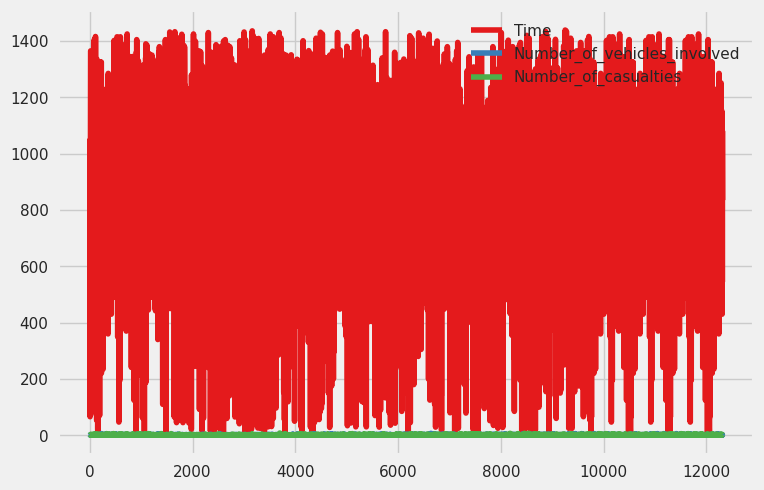

In [63]:
df2.plot(kind='line')  # Line plot for all numerical columns

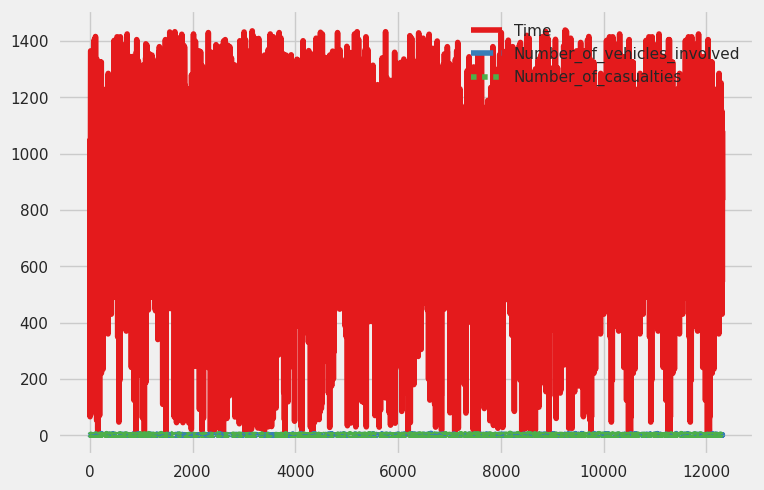

In [64]:
sns.lineplot(data=df2)  # Line plot for all numerical columns
plt.show()

<Axes: >

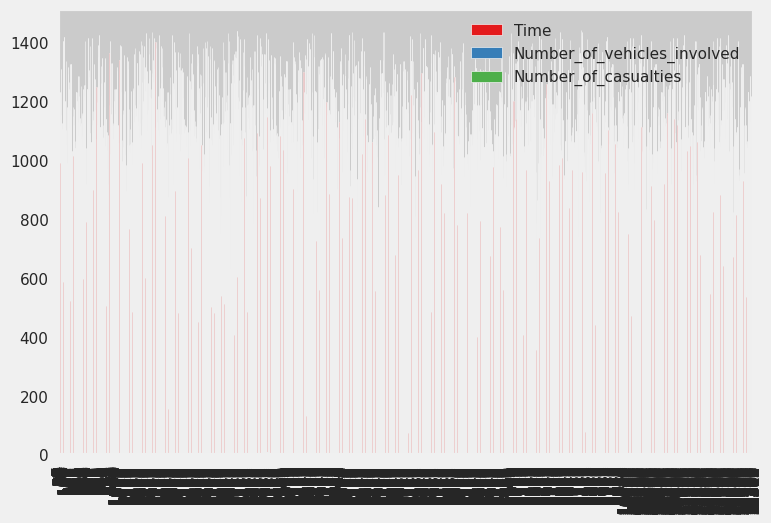

In [65]:
df2.plot(kind='bar')  # Bar plot for all numerical columns

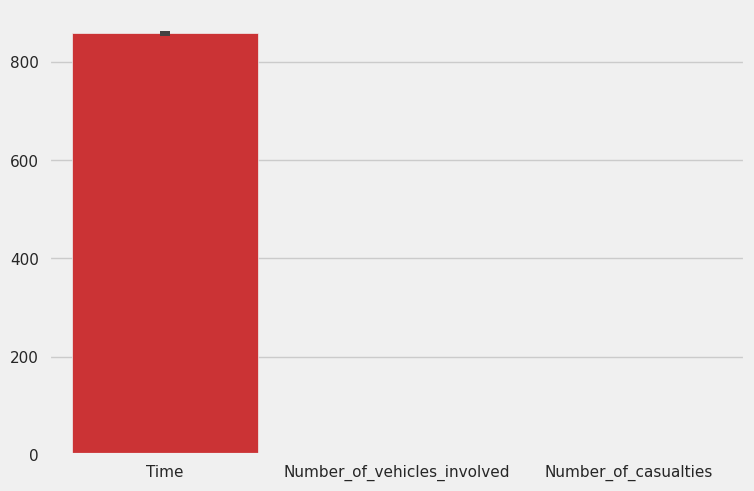

In [66]:
sns.barplot(data=df2)  # Bar plot for all numerical columns
plt.show()

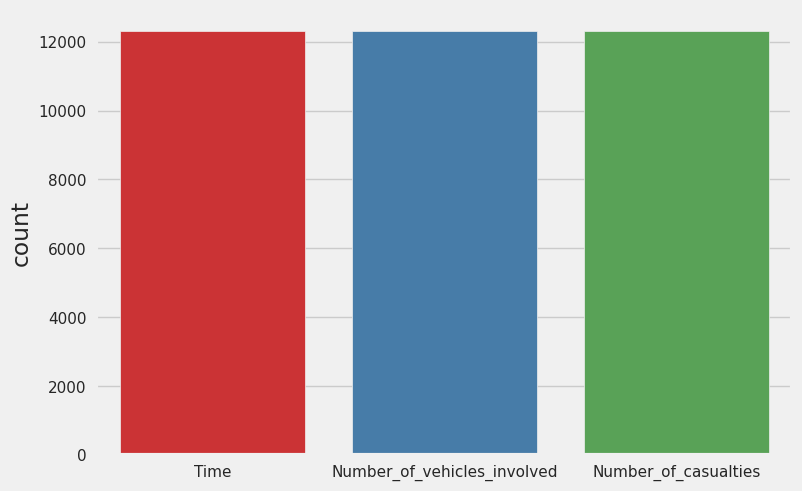

In [67]:
sns.countplot(data=df2)  # Count plot for all categorical columns
plt.show()

<Figure size 1000x600 with 0 Axes>

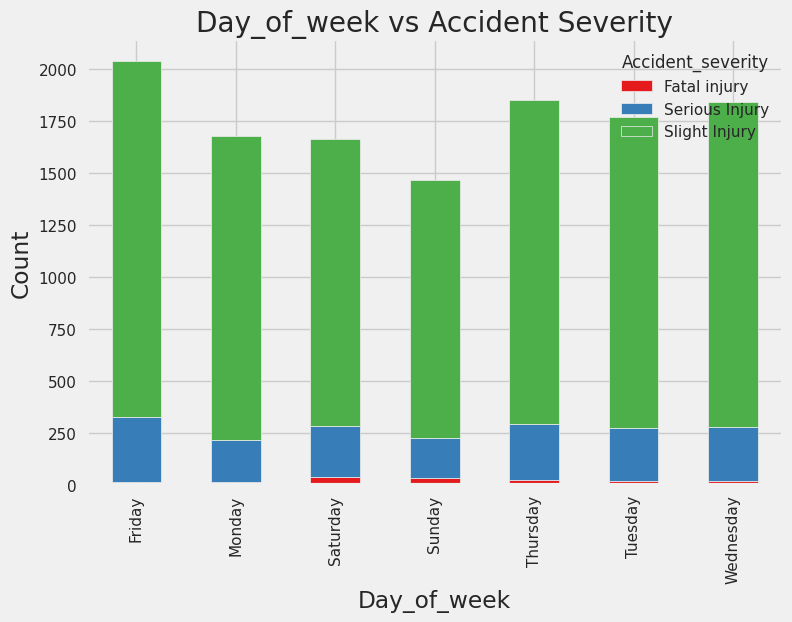

<Figure size 1000x600 with 0 Axes>

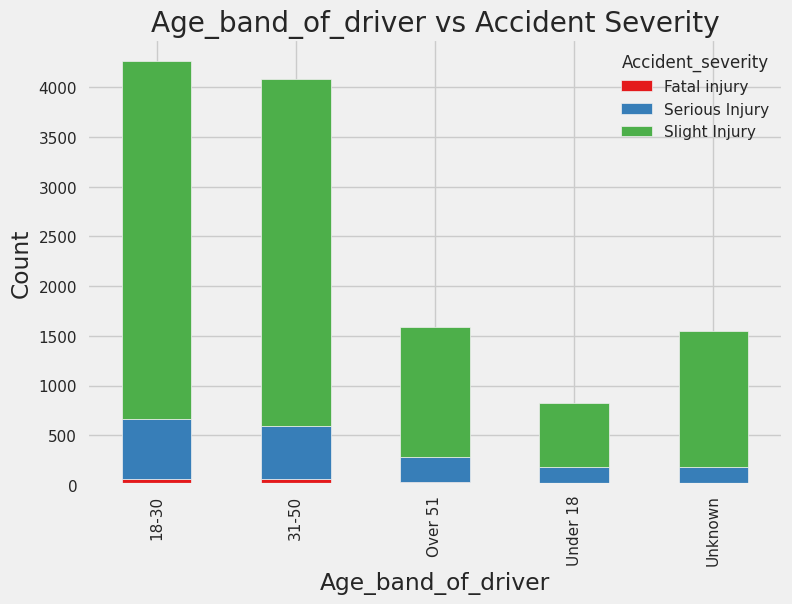

<Figure size 1000x600 with 0 Axes>

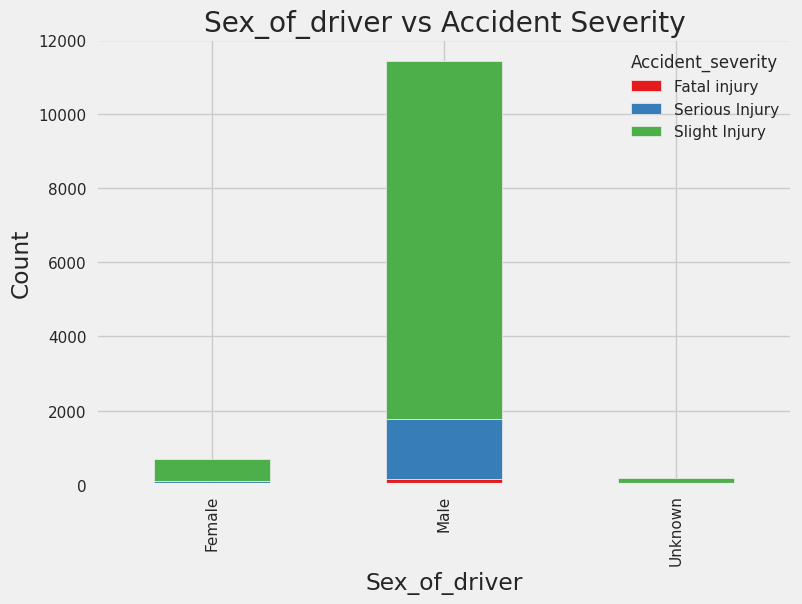

<Figure size 1000x600 with 0 Axes>

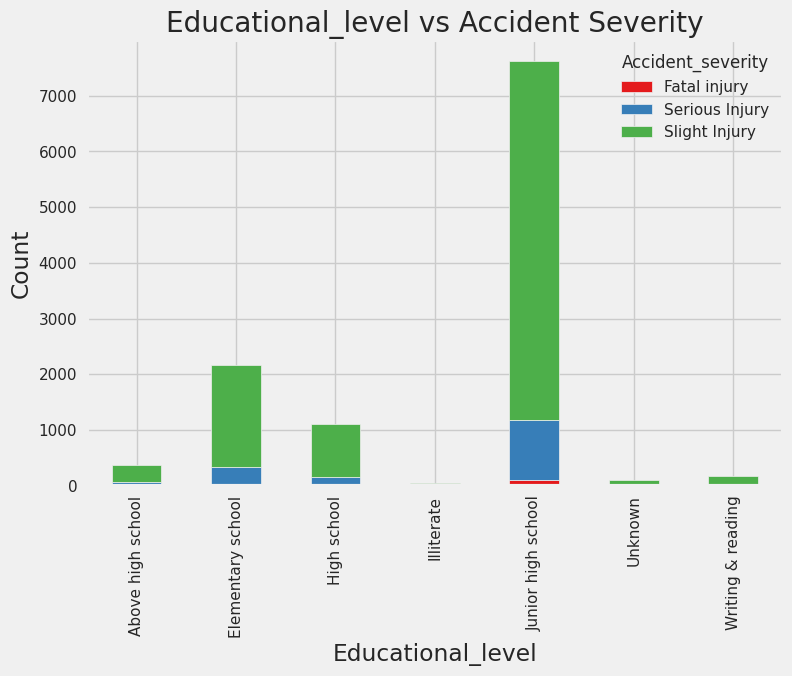

<Figure size 1000x600 with 0 Axes>

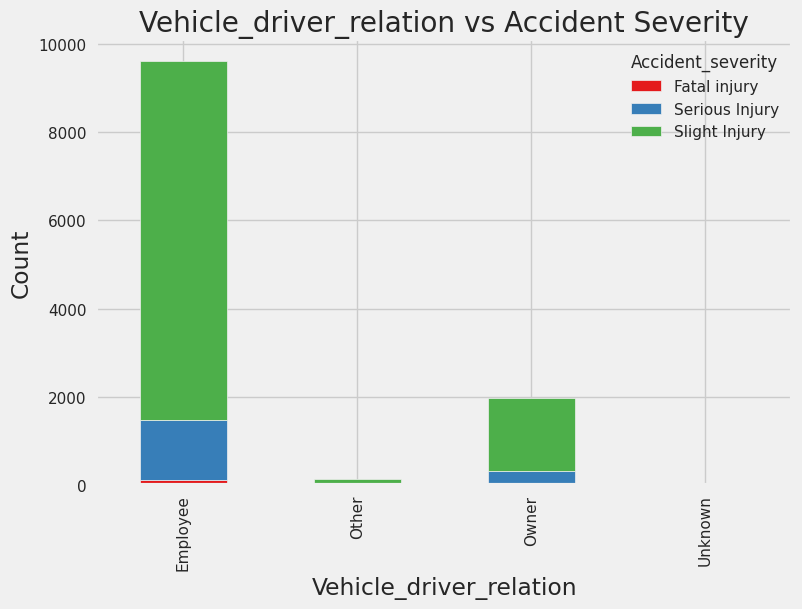

<Figure size 1000x600 with 0 Axes>

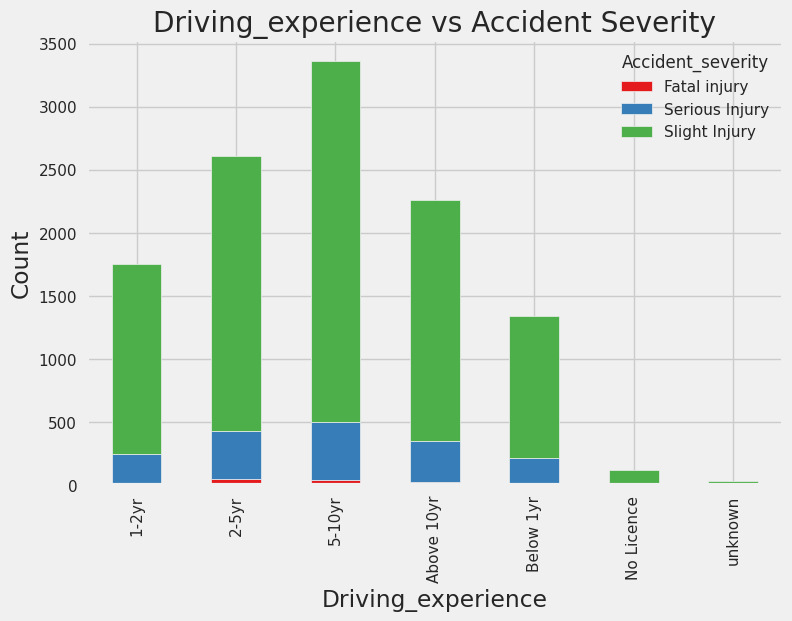

<Figure size 1000x600 with 0 Axes>

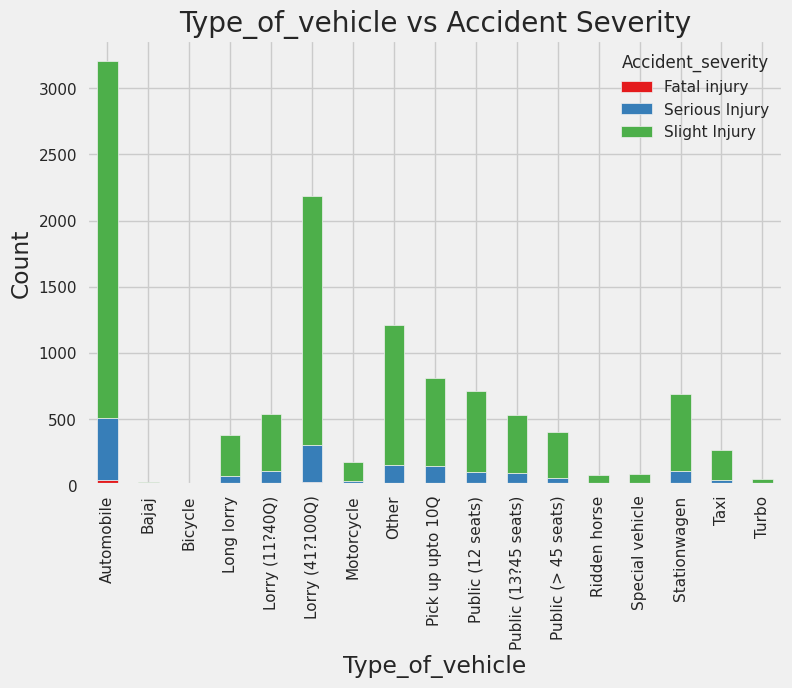

<Figure size 1000x600 with 0 Axes>

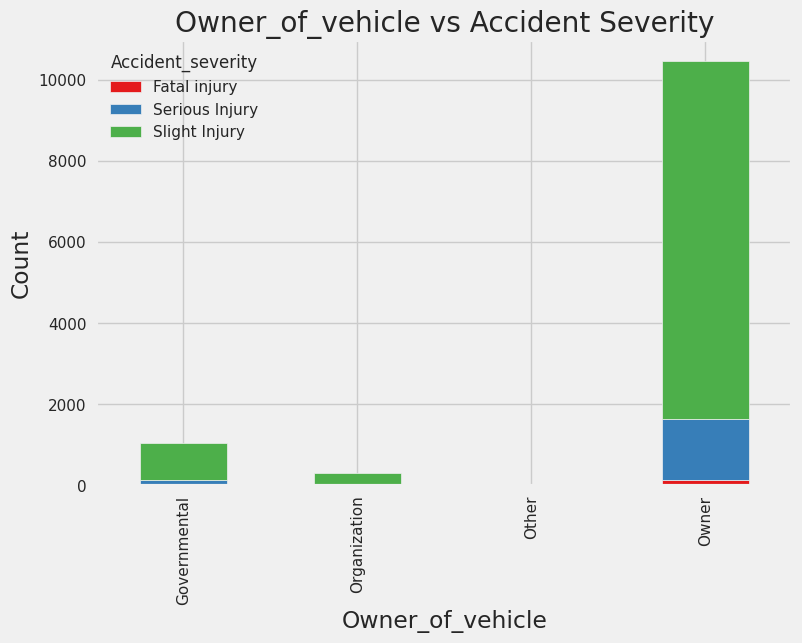

<Figure size 1000x600 with 0 Axes>

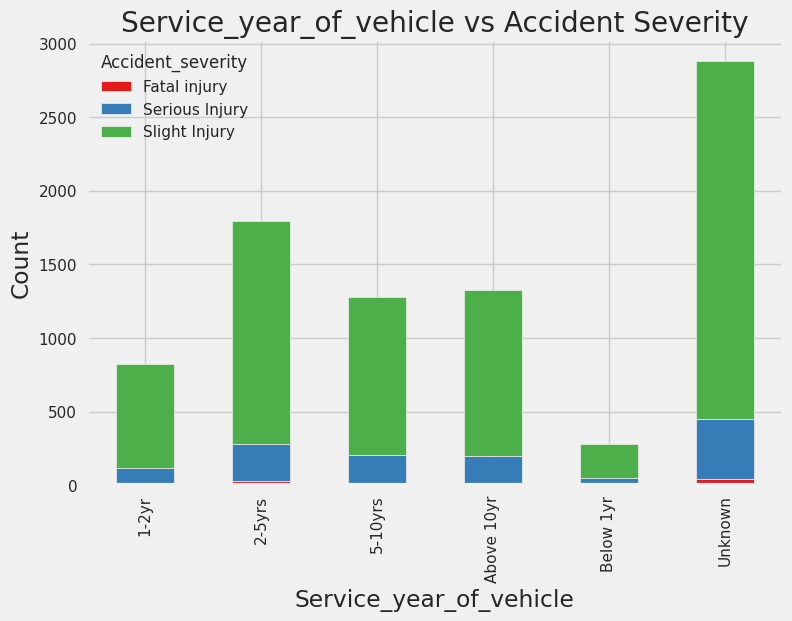

<Figure size 1000x600 with 0 Axes>

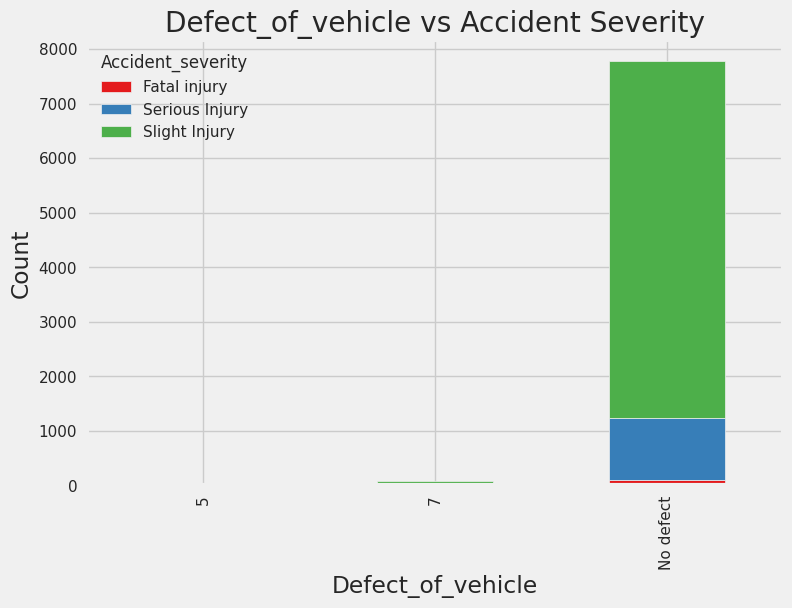

<Figure size 1000x600 with 0 Axes>

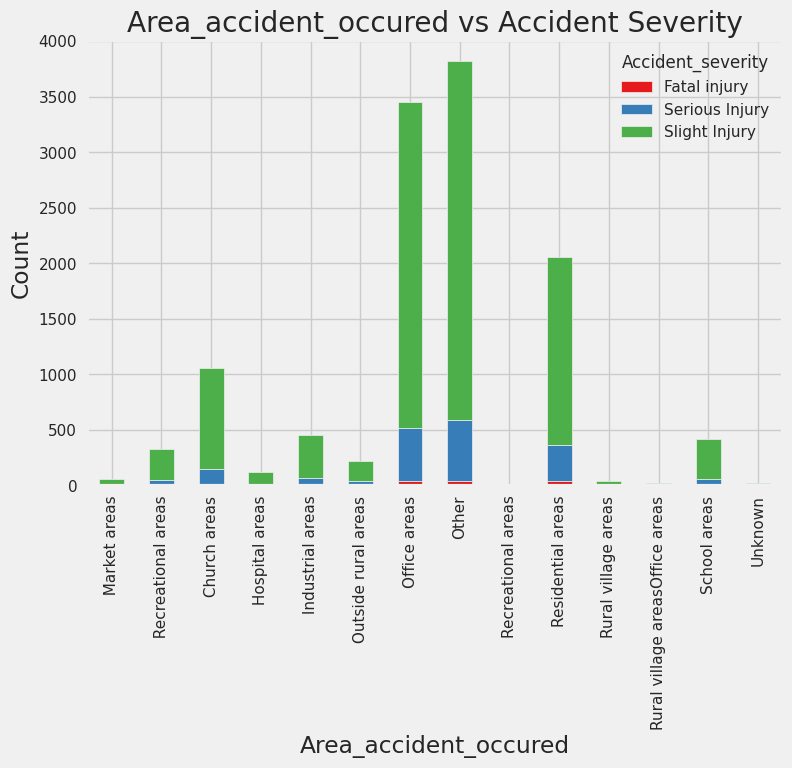

<Figure size 1000x600 with 0 Axes>

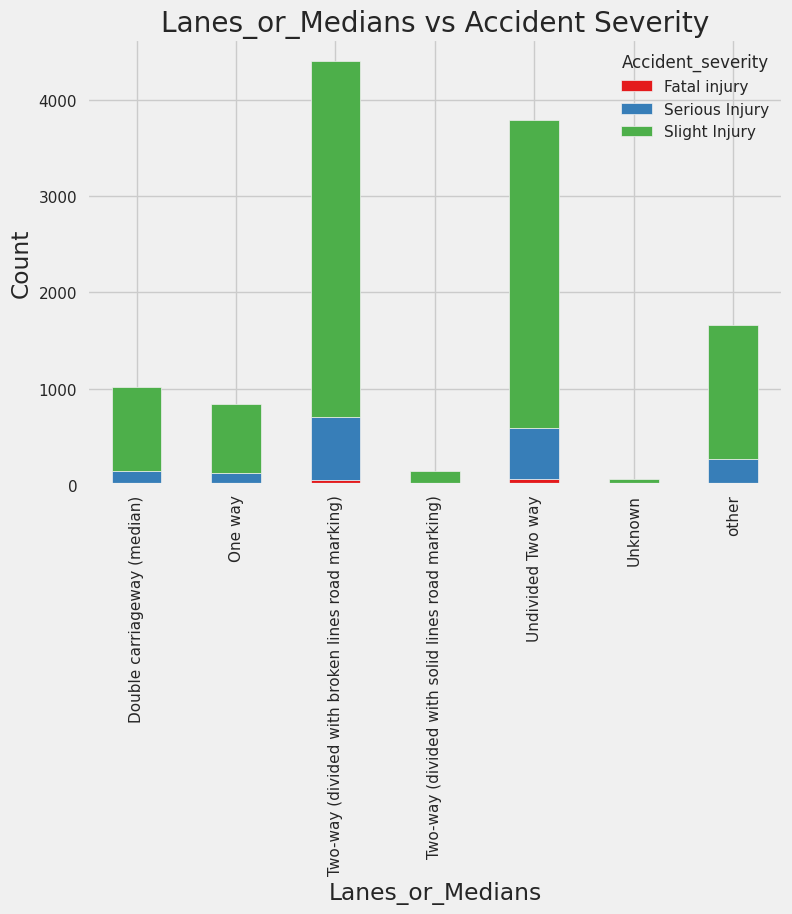

<Figure size 1000x600 with 0 Axes>

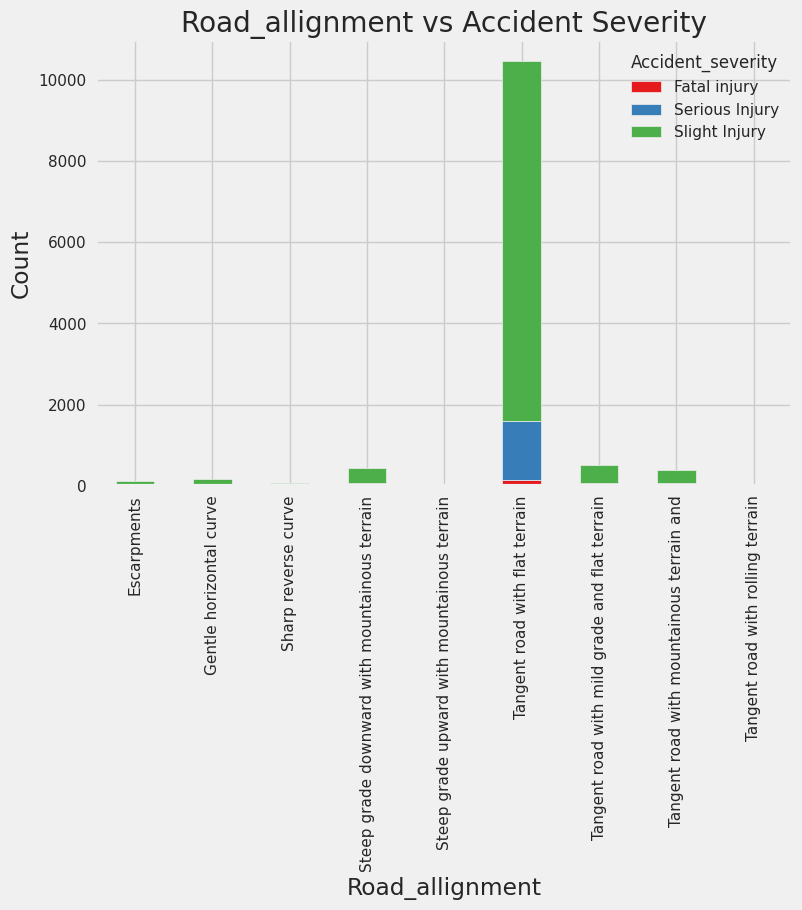

<Figure size 1000x600 with 0 Axes>

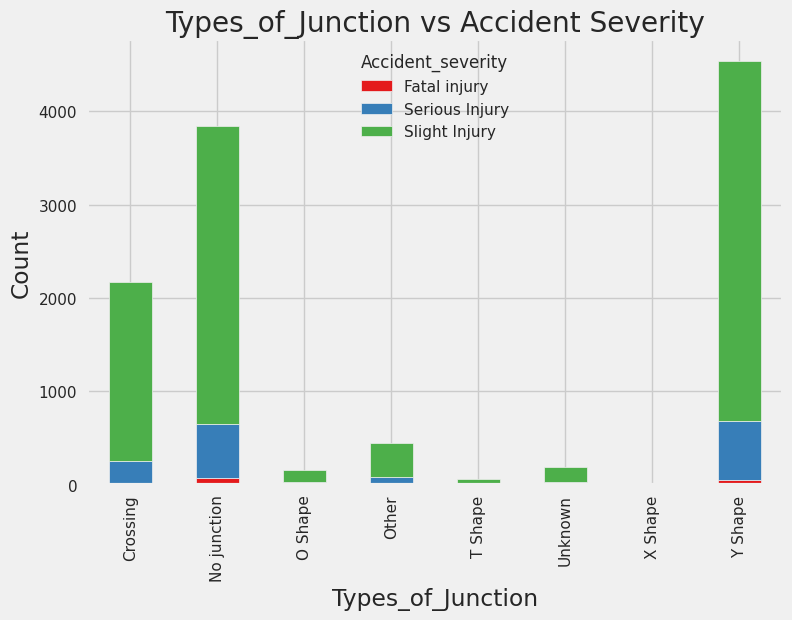

<Figure size 1000x600 with 0 Axes>

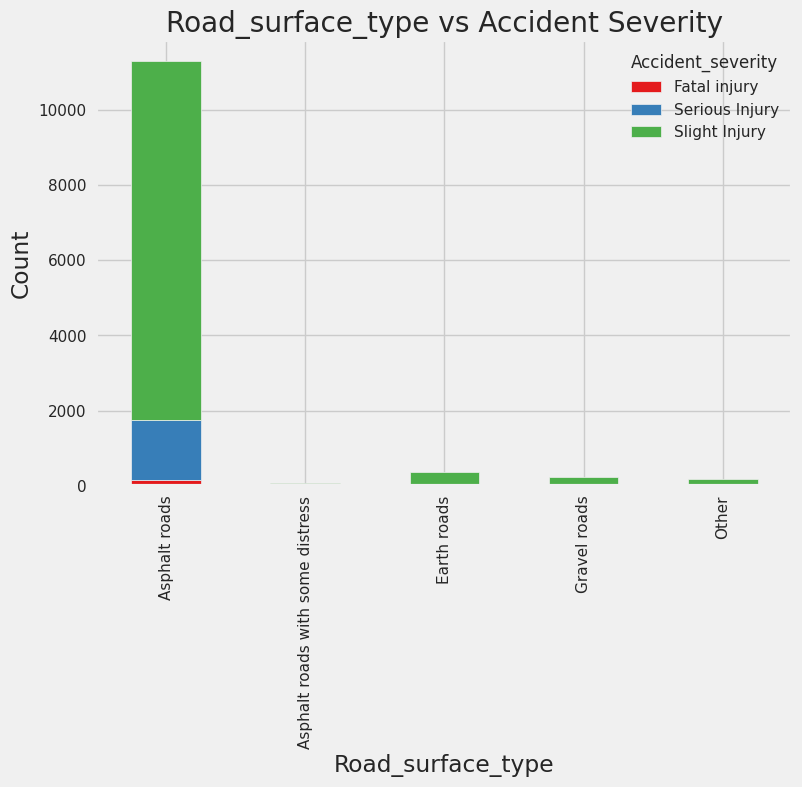

<Figure size 1000x600 with 0 Axes>

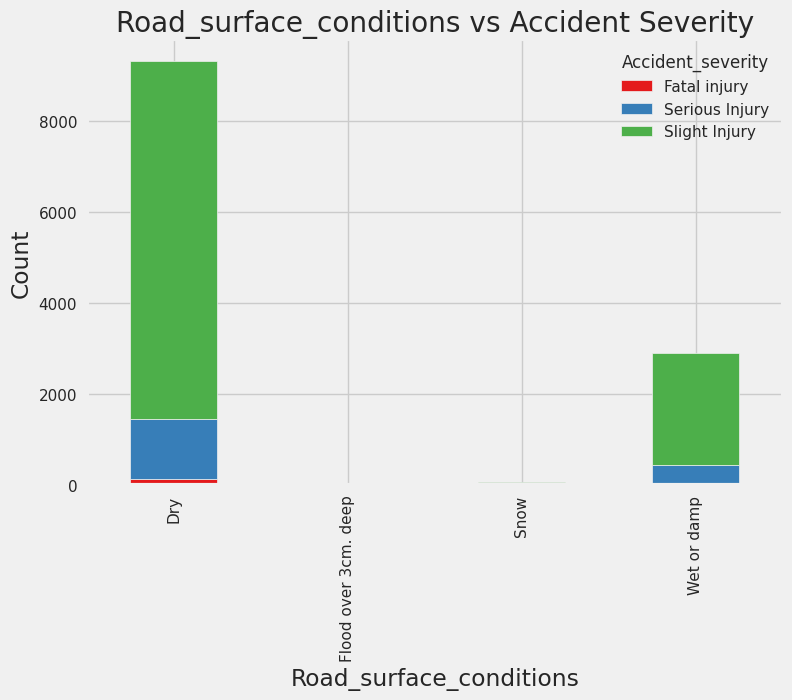

<Figure size 1000x600 with 0 Axes>

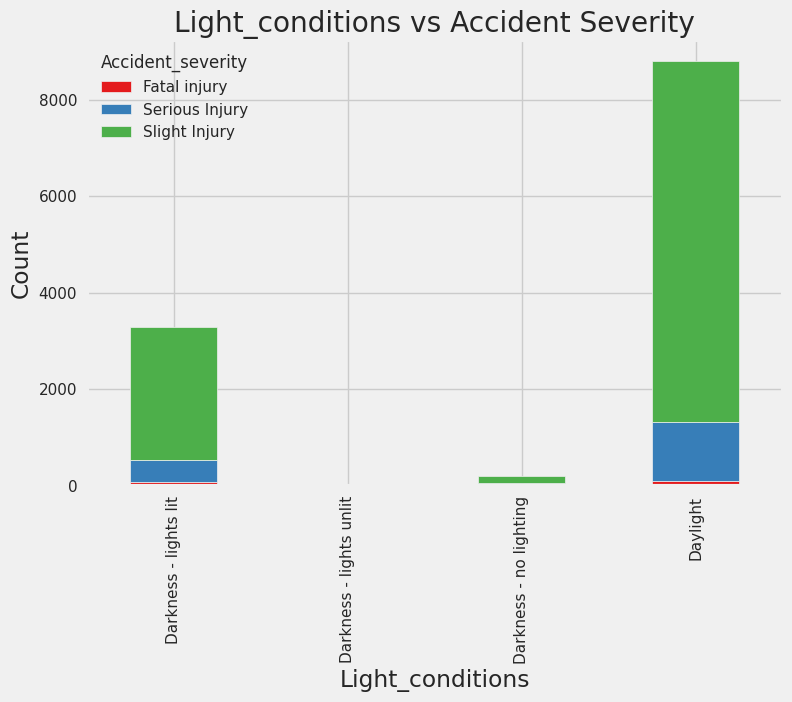

<Figure size 1000x600 with 0 Axes>

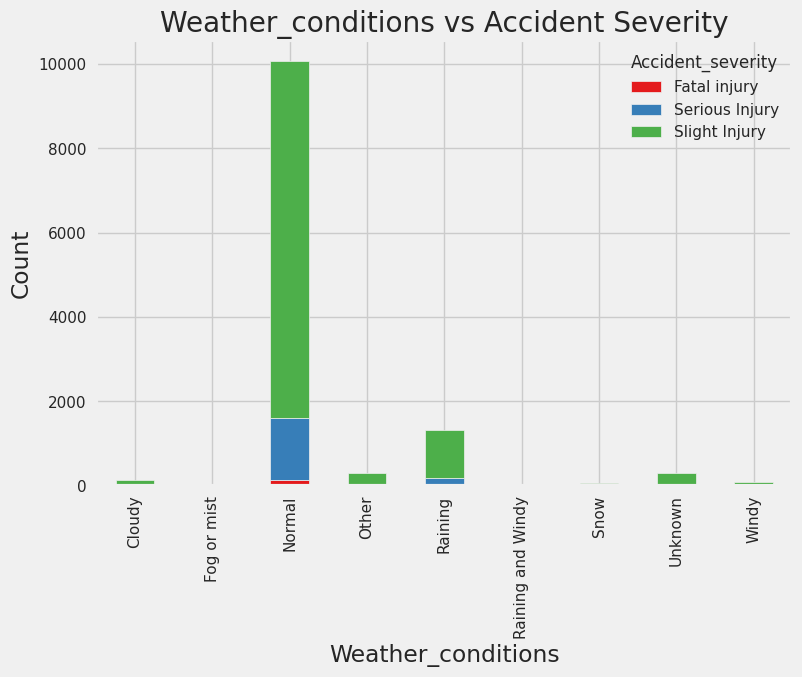

<Figure size 1000x600 with 0 Axes>

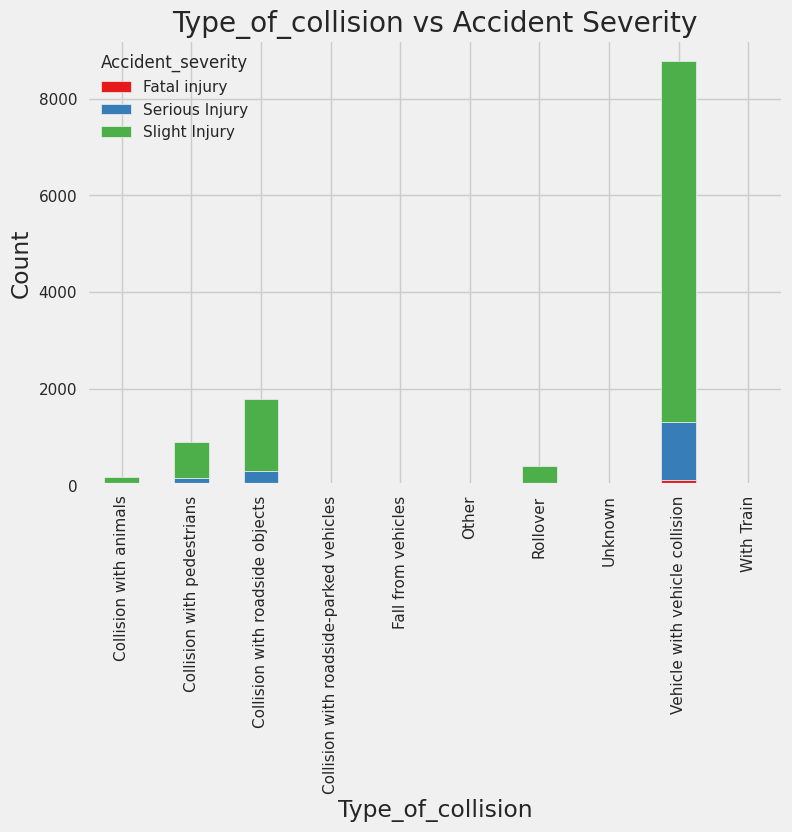

<Figure size 1000x600 with 0 Axes>

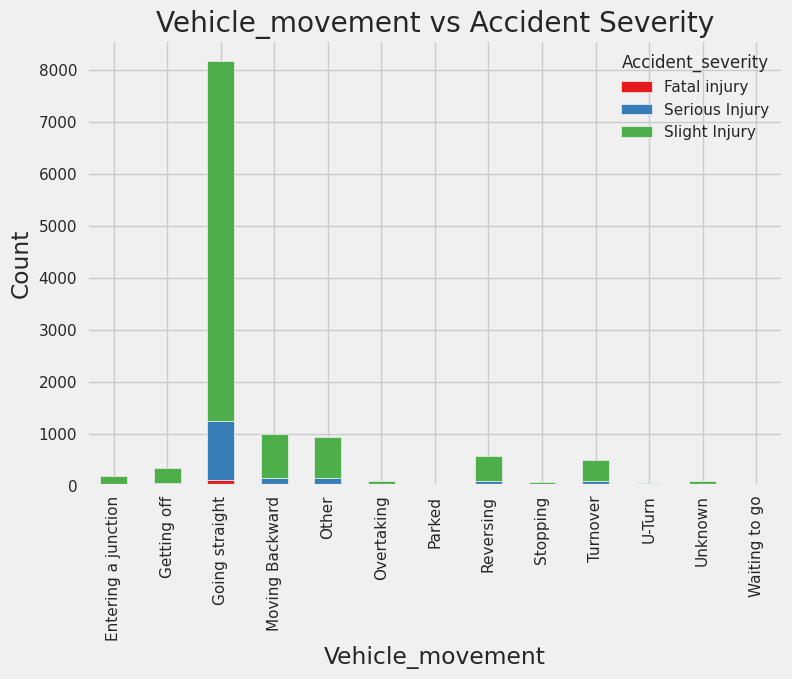

<Figure size 1000x600 with 0 Axes>

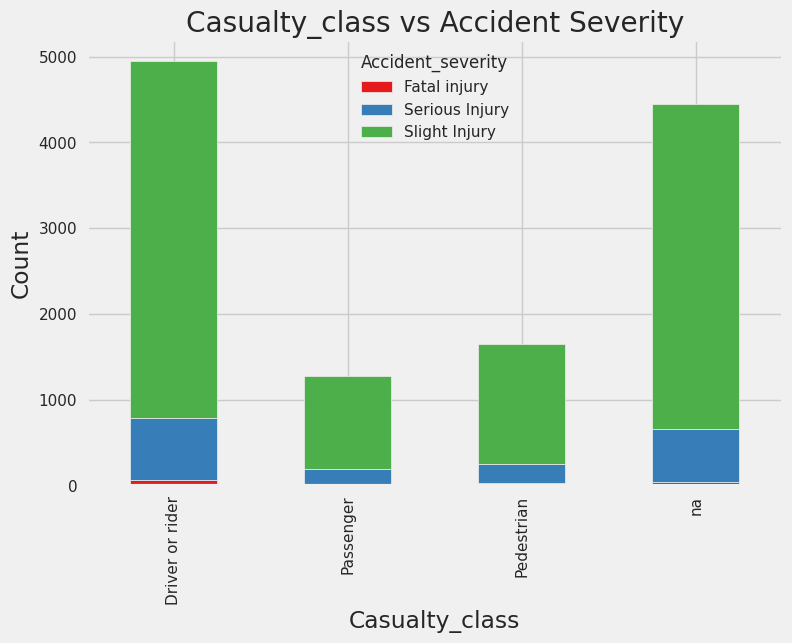

<Figure size 1000x600 with 0 Axes>

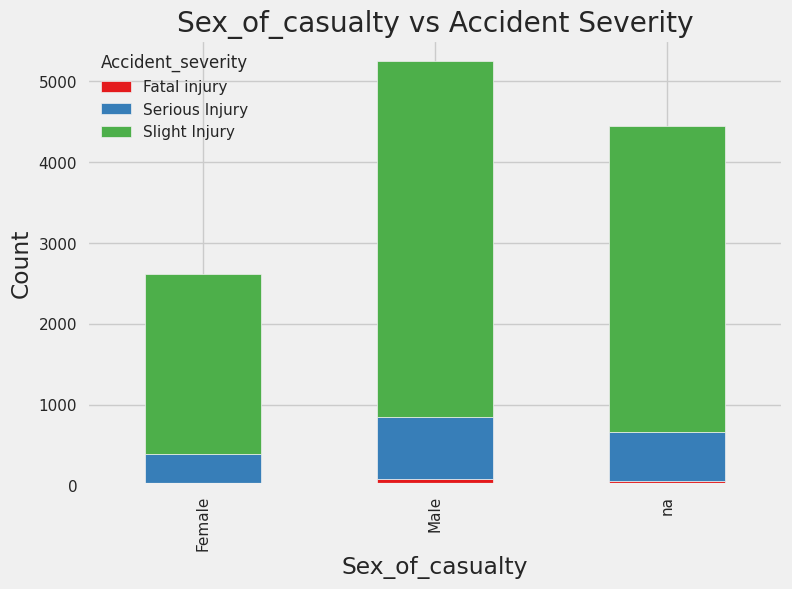

<Figure size 1000x600 with 0 Axes>

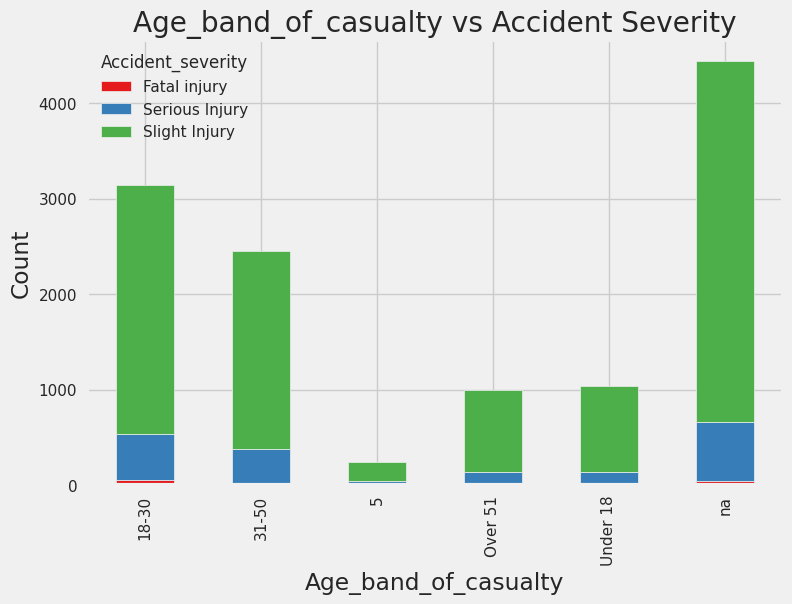

<Figure size 1000x600 with 0 Axes>

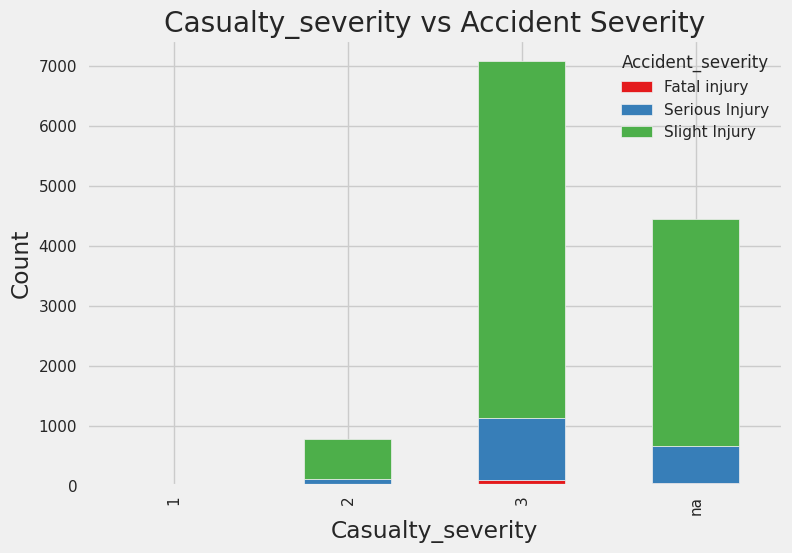

<Figure size 1000x600 with 0 Axes>

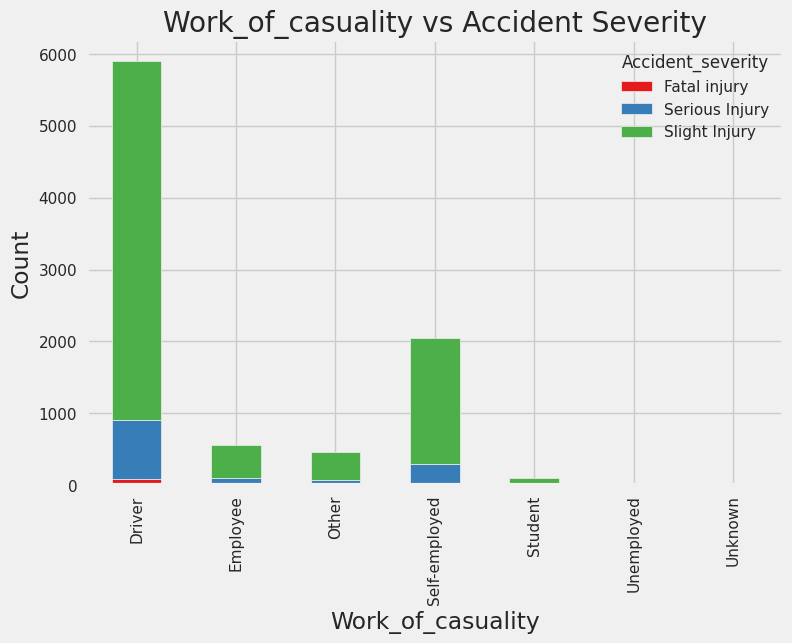

<Figure size 1000x600 with 0 Axes>

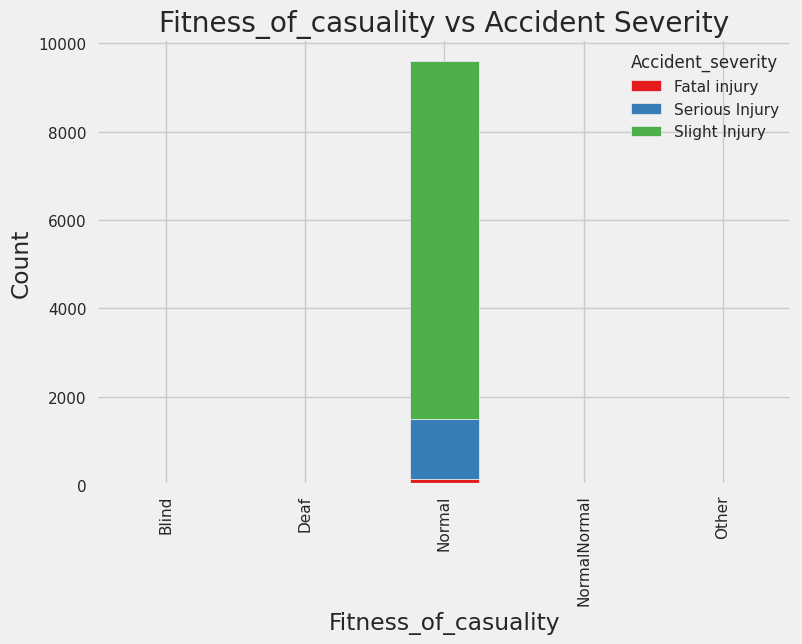

<Figure size 1000x600 with 0 Axes>

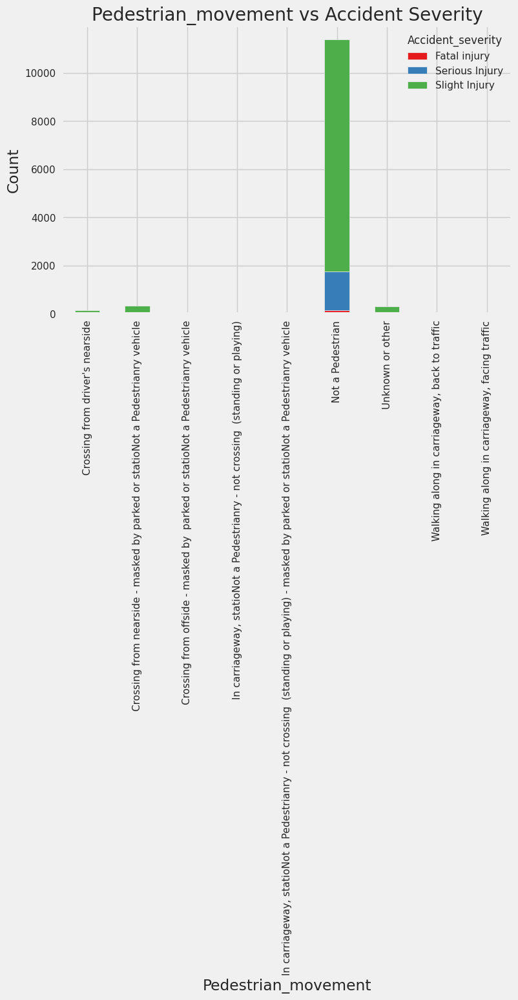

<Figure size 1000x600 with 0 Axes>

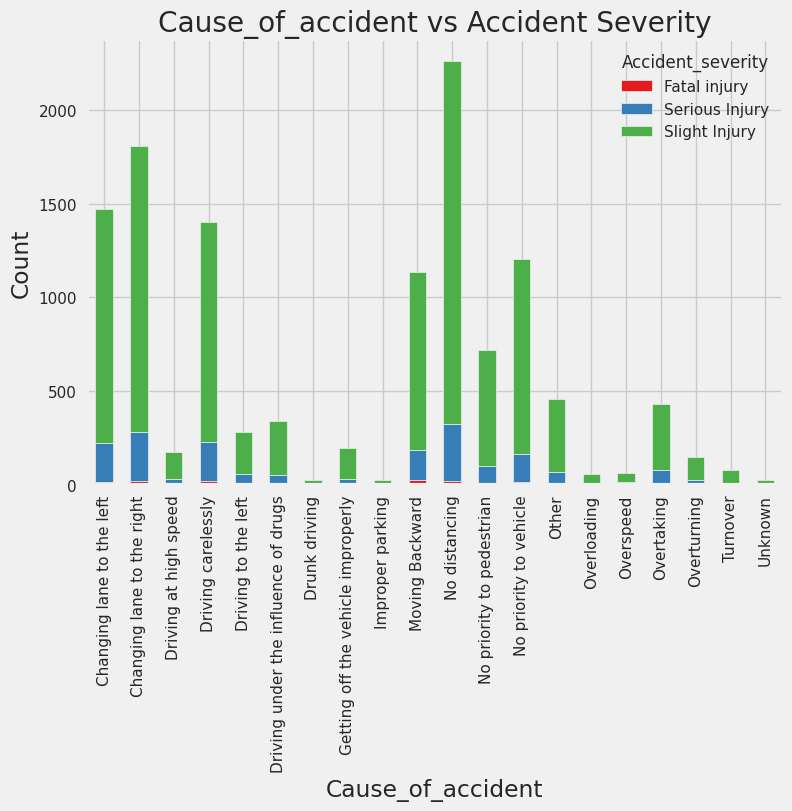

In [68]:
# Get all categorical columns except the target column
categorical_columns = [col for col in df2.columns if df2[col].dtype == 'object' and col != target]

# Generate bar plots for each categorical column
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    df2.groupby(col)[target].value_counts().unstack().plot(kind='bar', stacked=True)
    plt.title(f"{col} vs Accident Severity")
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title=target)
    plt.show()

In [ ]:
# Get all categorical columns except the target column
categorical_columns = [col for col in df2.columns if df2[col].dtype == 'object' and col != target]

# Generate bar plots for each categorical column
for col in categorical_columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(data=df2, x=col, hue=target, palette='Dark2')
    plt.title(col.title())
    plt.xlabel("Count")
    plt.ylabel("")
    plt.legend(title=target)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

<Figure size 1200x600 with 0 Axes>

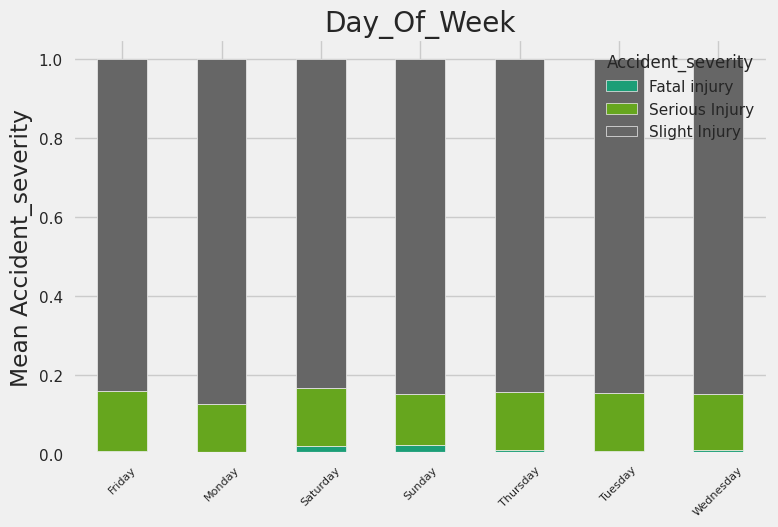

<Figure size 1200x600 with 0 Axes>

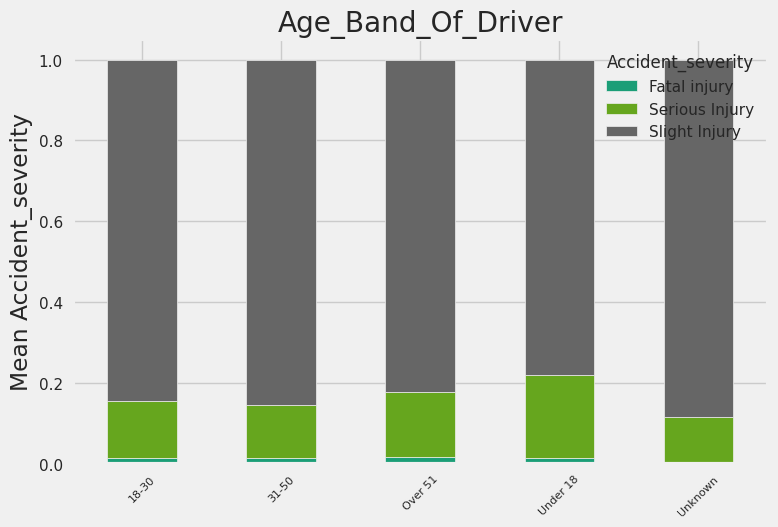

<Figure size 1200x600 with 0 Axes>

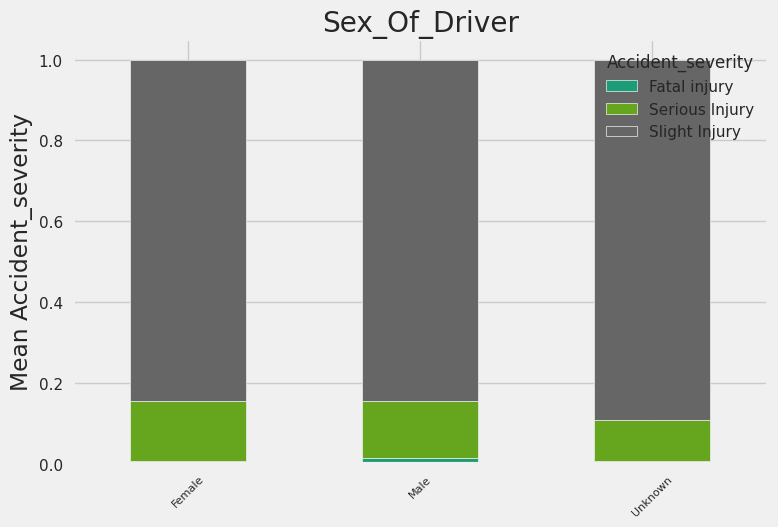

<Figure size 1200x600 with 0 Axes>

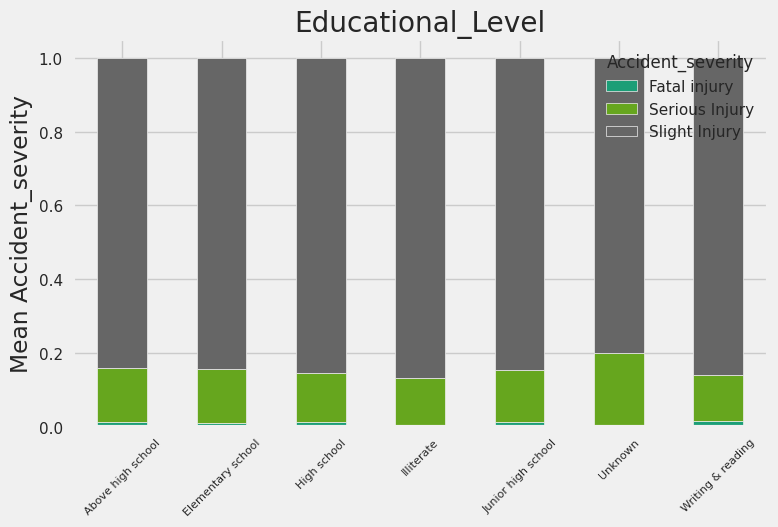

<Figure size 1200x600 with 0 Axes>

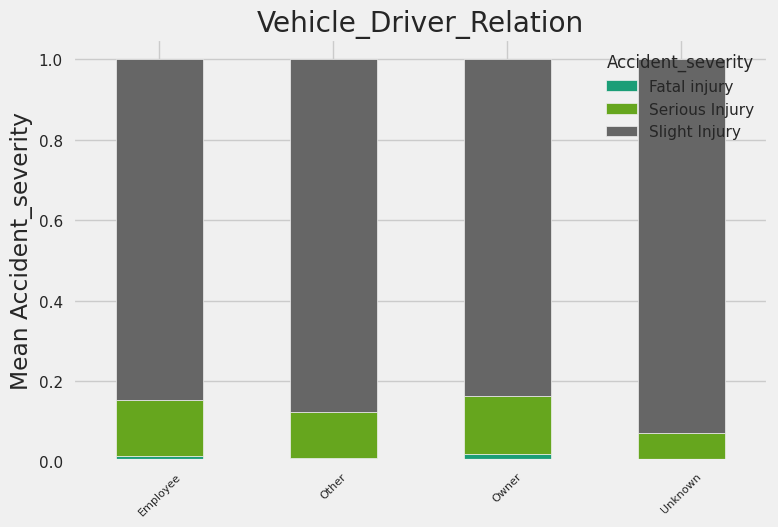

<Figure size 1200x600 with 0 Axes>

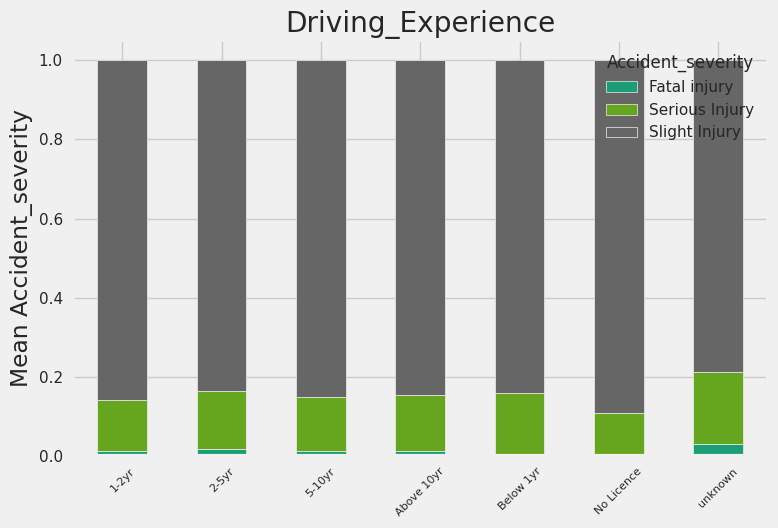

<Figure size 1200x600 with 0 Axes>

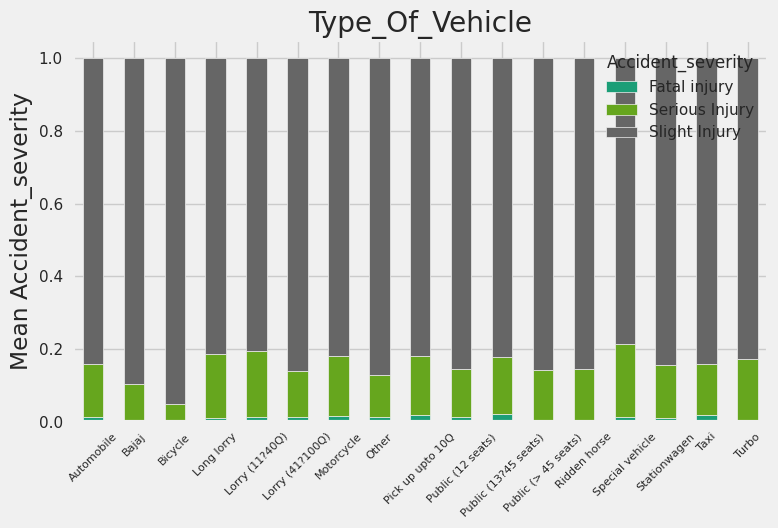

<Figure size 1200x600 with 0 Axes>

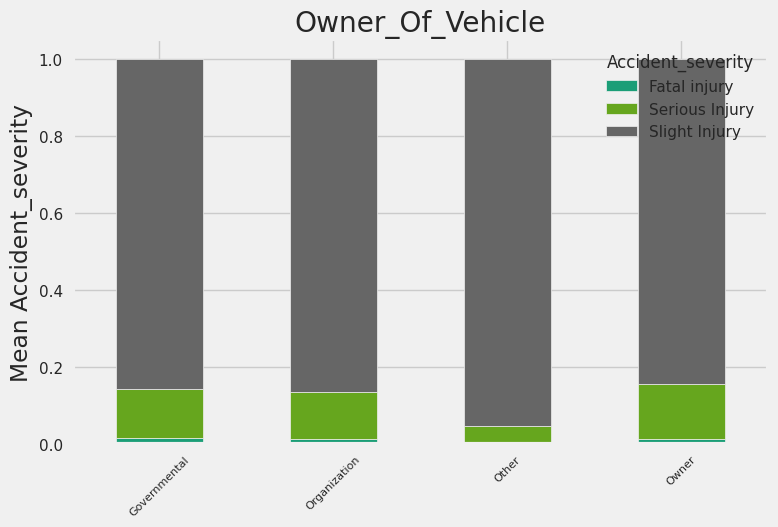

<Figure size 1200x600 with 0 Axes>

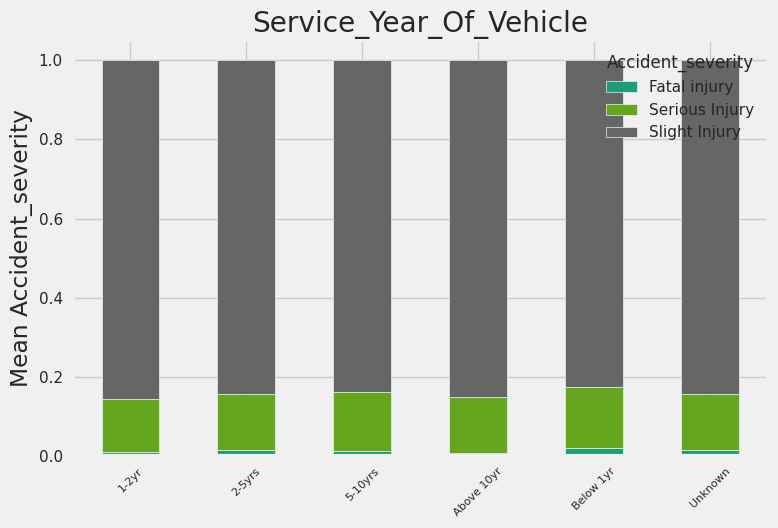

<Figure size 1200x600 with 0 Axes>

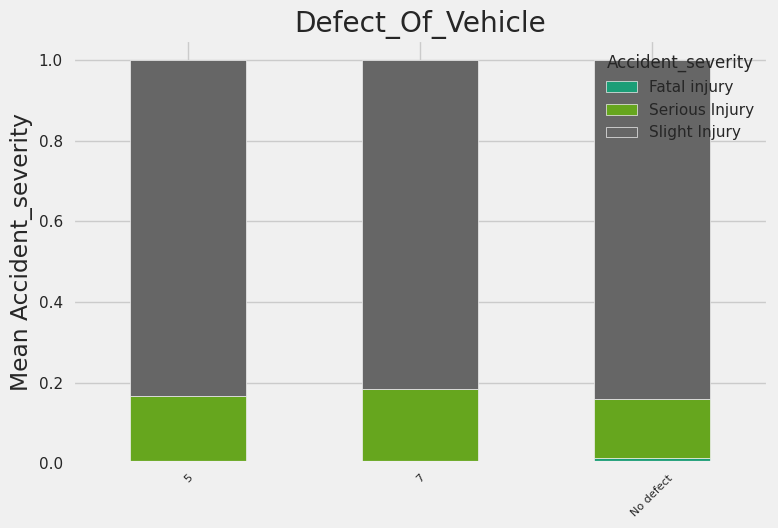

<Figure size 1200x600 with 0 Axes>

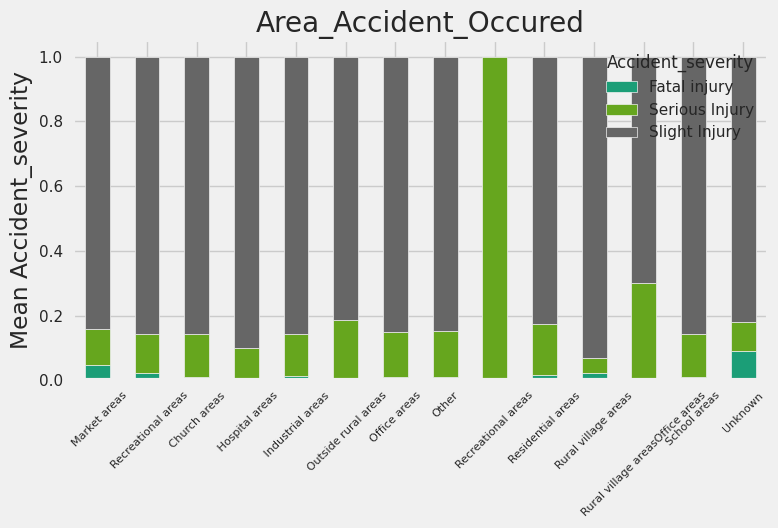

<Figure size 1200x600 with 0 Axes>

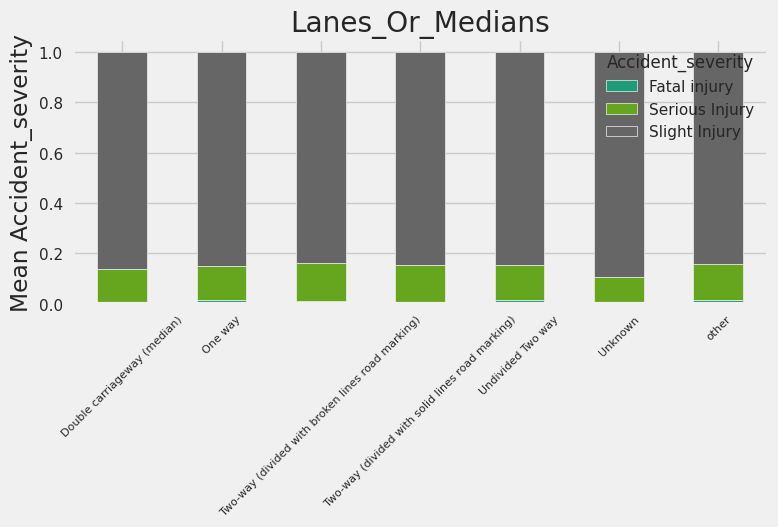

<Figure size 1200x600 with 0 Axes>

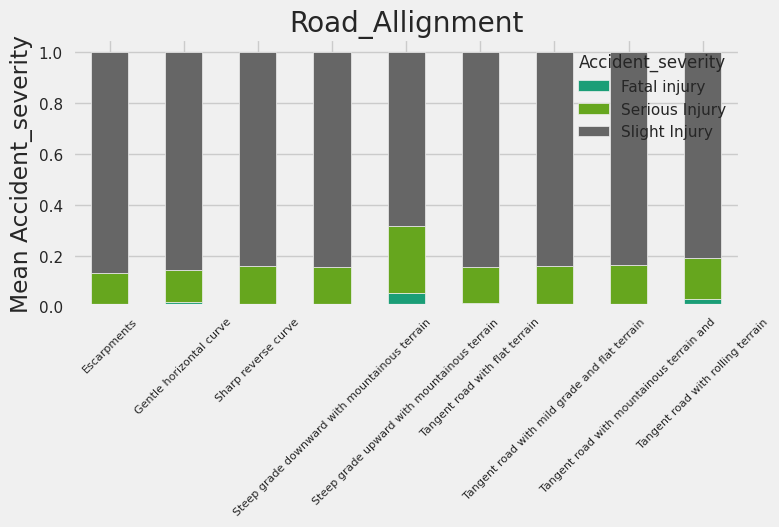

<Figure size 1200x600 with 0 Axes>

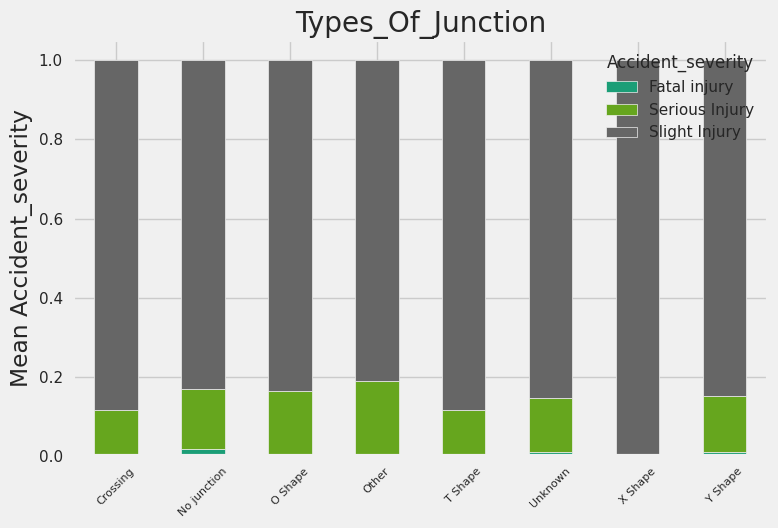

<Figure size 1200x600 with 0 Axes>

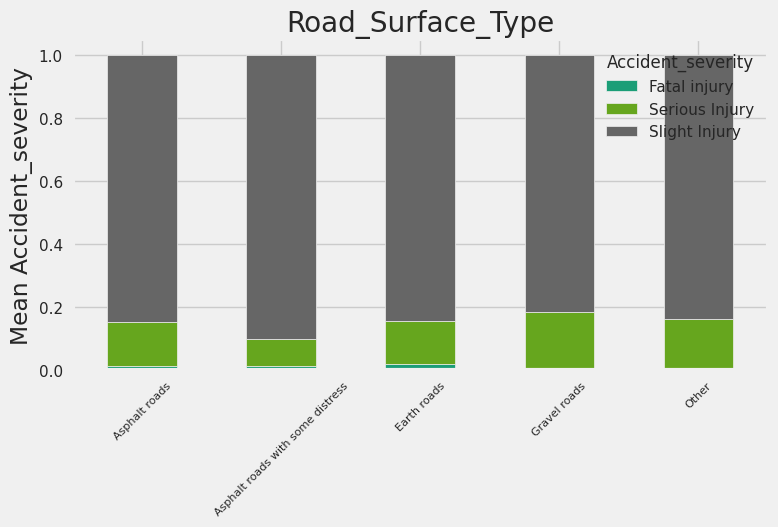

<Figure size 1200x600 with 0 Axes>

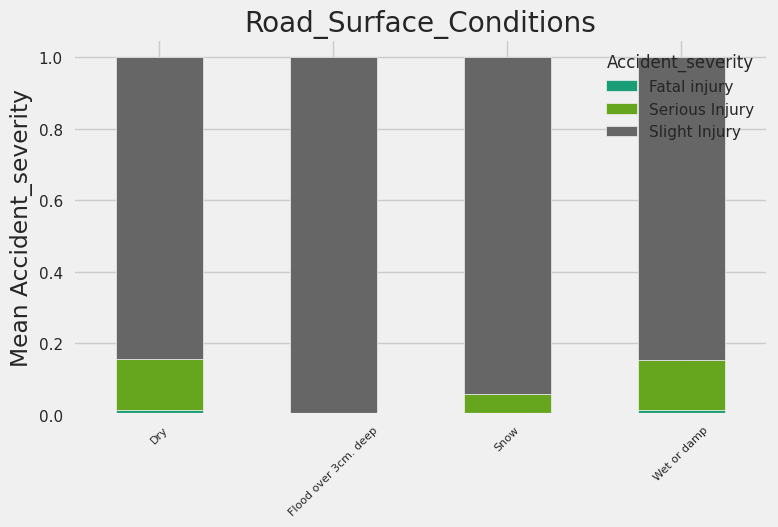

<Figure size 1200x600 with 0 Axes>

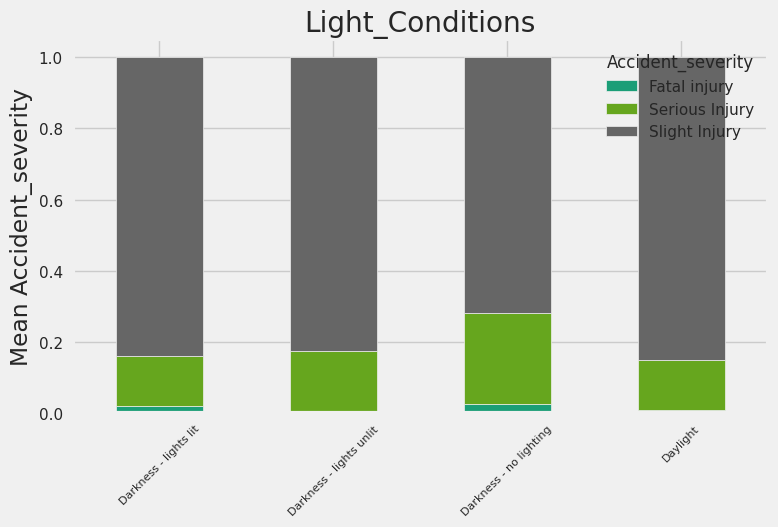

<Figure size 1200x600 with 0 Axes>

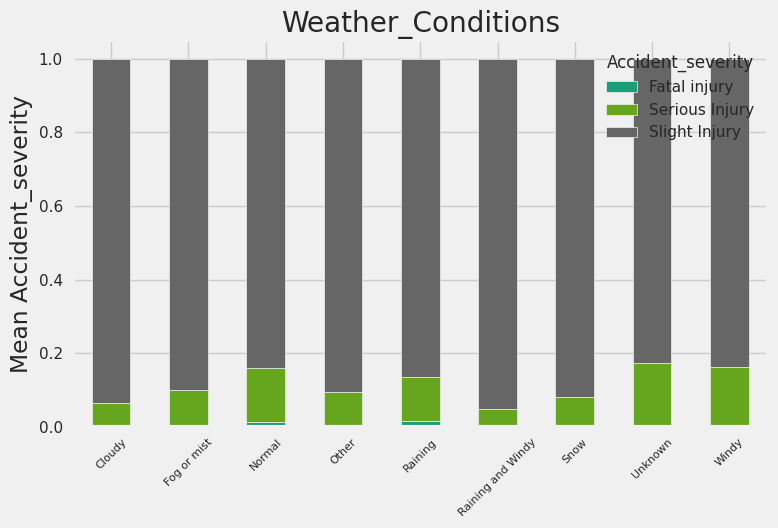

<Figure size 1200x600 with 0 Axes>

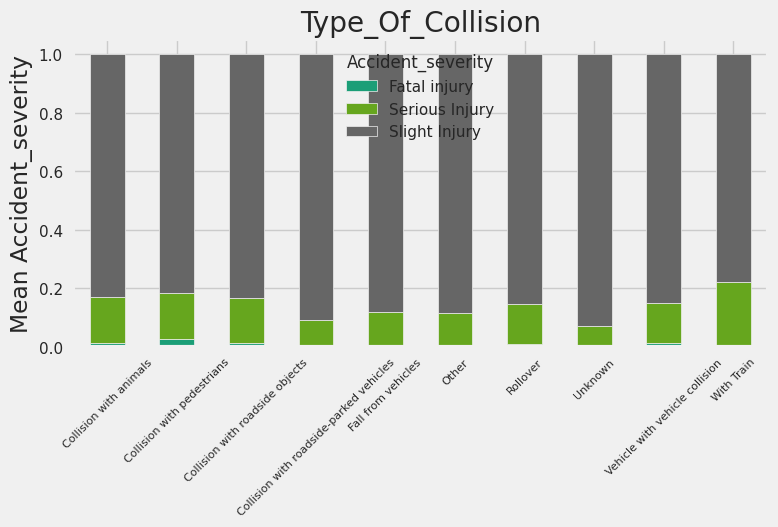

<Figure size 1200x600 with 0 Axes>

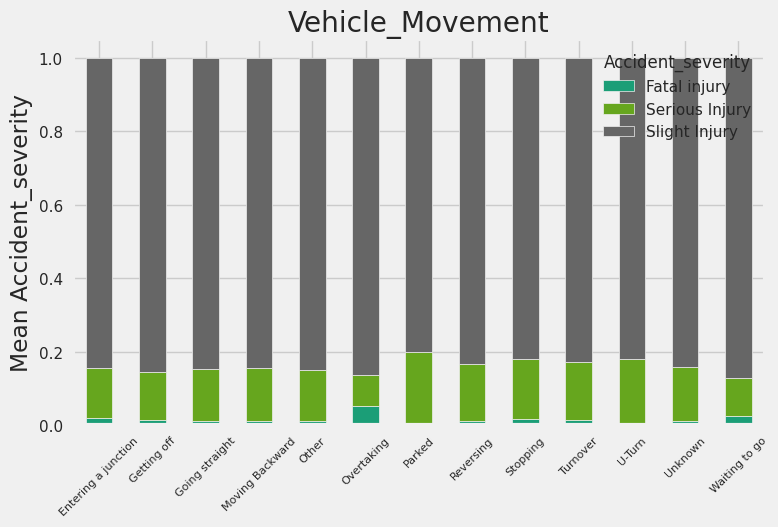

<Figure size 1200x600 with 0 Axes>

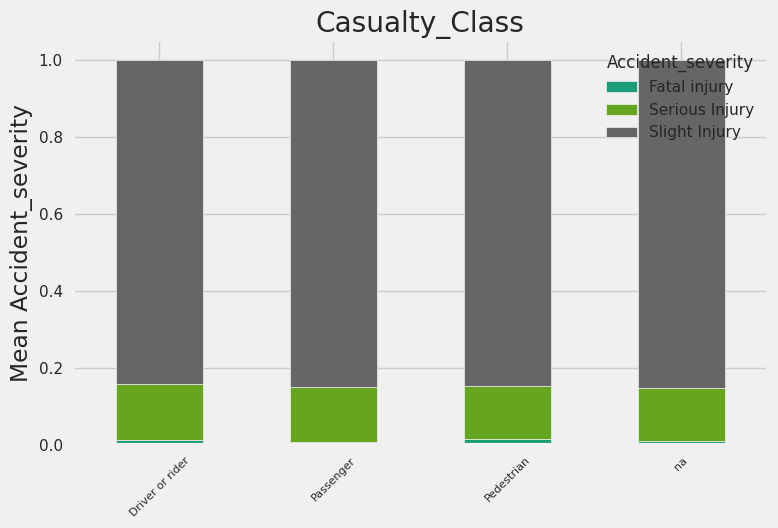

<Figure size 1200x600 with 0 Axes>

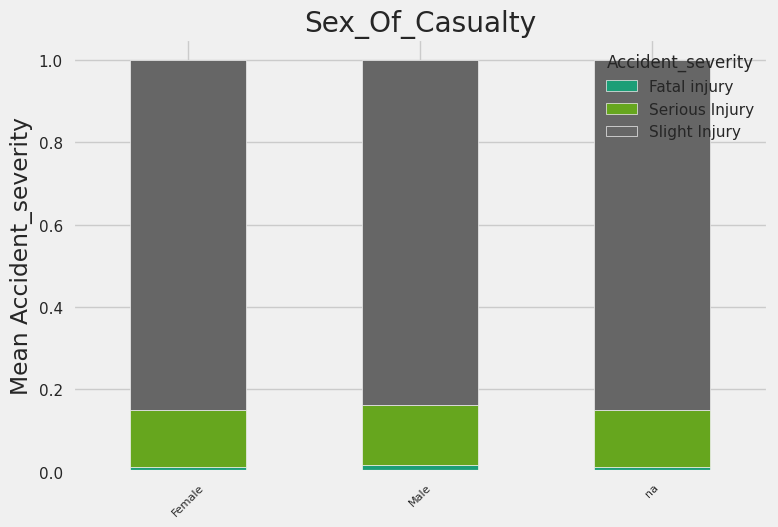

<Figure size 1200x600 with 0 Axes>

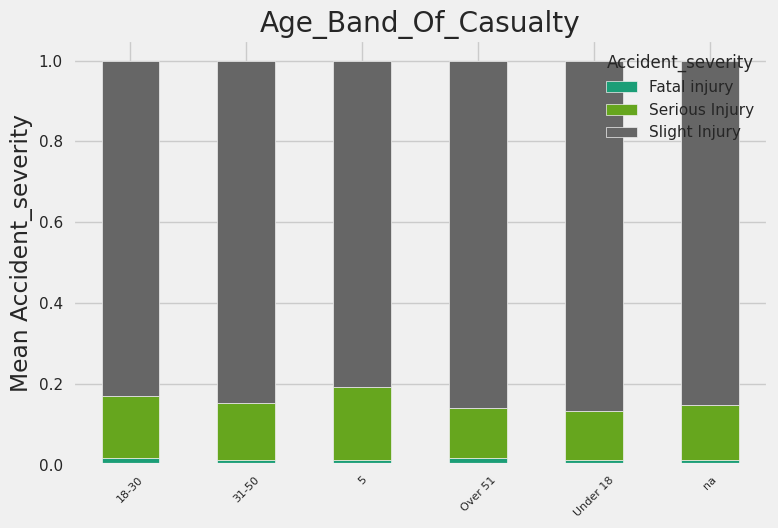

<Figure size 1200x600 with 0 Axes>

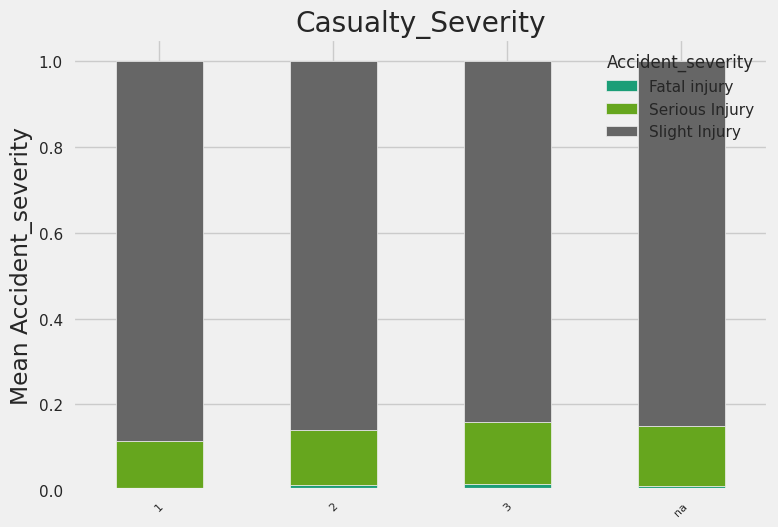

<Figure size 1200x600 with 0 Axes>

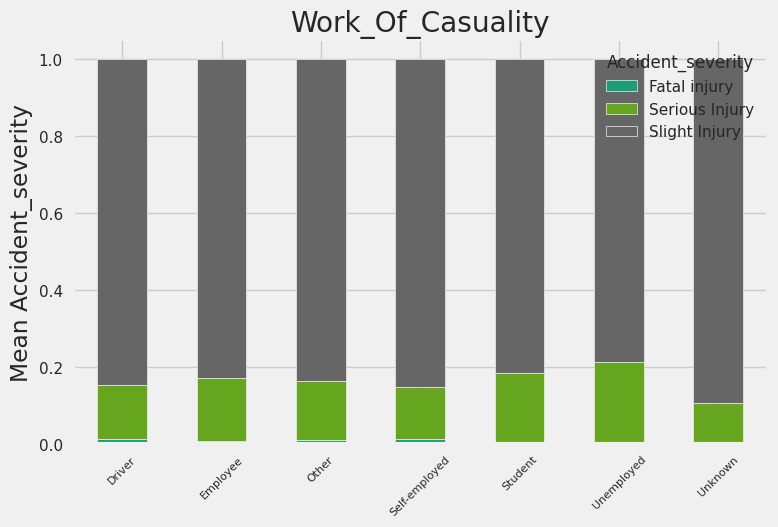

<Figure size 1200x600 with 0 Axes>

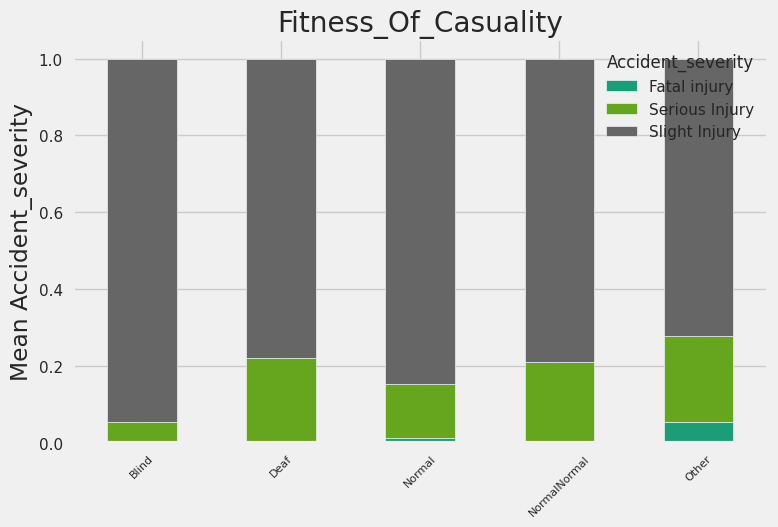

<Figure size 1200x600 with 0 Axes>

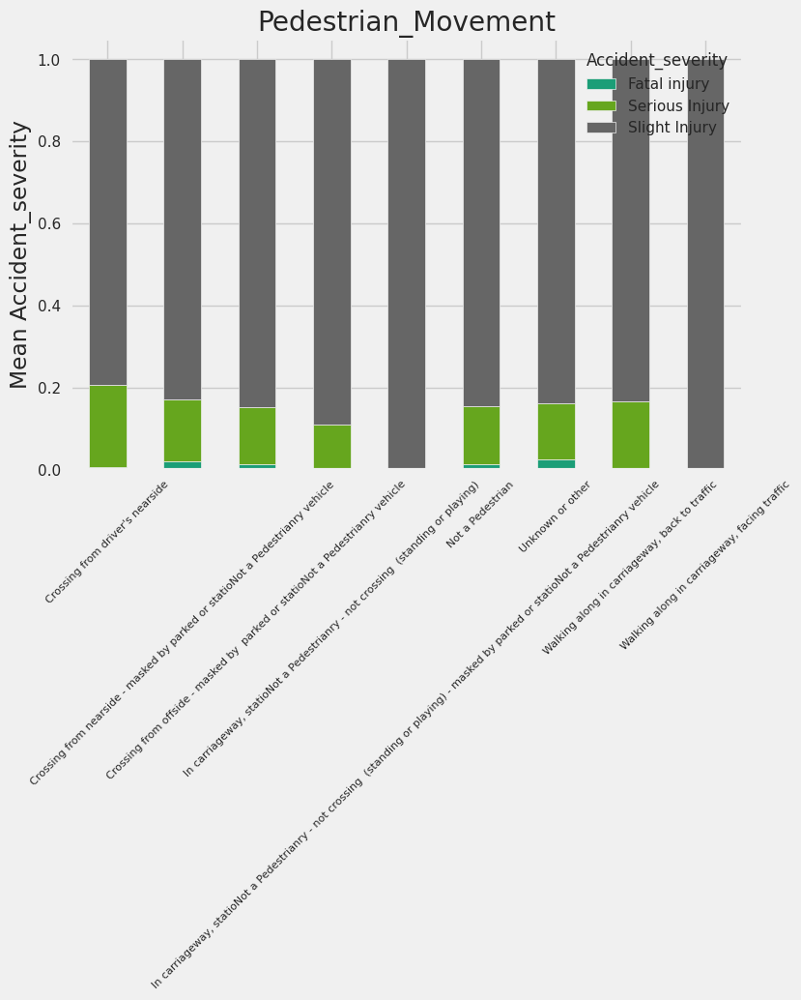

<Figure size 1200x600 with 0 Axes>

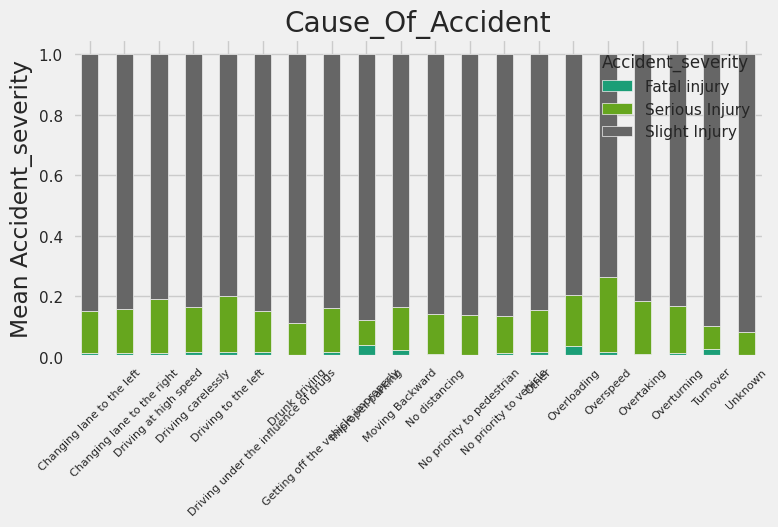

In [69]:
# Get all categorical columns except the target column
categorical_columns = [col for col in df2.columns if df2[col].dtype == 'object' and col != target]

# Generate bar plots for each categorical column
for col in categorical_columns:
    plt.figure(figsize=(12, 6))
    df_counts = df2.groupby(col)[target].value_counts().unstack()
    df_mean = df_counts.div(df_counts.sum(axis=1), axis=0)
    df_mean.plot(kind='bar', stacked=True, colormap='Dark2')
    plt.title(col.title())
    plt.xlabel("")
    plt.ylabel("Mean " + target)
    plt.legend(title=target)
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()

In [ ]:
# Get all categorical columns except the target column
categorical_columns = [col for col in df2.columns if df2[col].dtype == 'object' and col != target]

# Generate bar plots for each categorical column based on mean
for col in categorical_columns:
    plt.figure(figsize=(20, 6))
    df_mean = df2.groupby(col)[target].value_counts(normalize=True).unstack()

    df_mean.plot(kind='bar', colormap='Dark2')
    plt.title(col.title())
    plt.xlabel(col)
    plt.ylabel("Mean " + target)
    plt.legend(title=target, loc='upper right')
    plt.xticks(rotation=45, fontsize=8)
    plt.tight_layout()
    plt.show()


In [72]:
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=df2['Time'], y=df2[target], name='Time'))
fig.update_layout(
    title_text="<b>Time<b>")
fig.update_xaxes(title_text="<b>Time<b>")
fig.update_yaxes(title_text="<b>Accident severity</b>", secondary_y=False)
fig.show()

In [73]:
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=df2['Number_of_casualties'], y=df2[target], name='Number_of_casualties'))
fig.update_layout(
    title_text="<b>Number_of_casualties<b>")
fig.update_xaxes(title_text="<b>Number_of_casualties<b>")
fig.update_yaxes(title_text="<b>Accident severity</b>", secondary_y=False)
fig.show()

In [75]:
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=df2['Number_of_vehicles_involved'], y=df2[target],name='Number_of_vehicles_involved'))
fig.update_layout(
    title_text="<b>Number_of_vehicles_involved<b>")
fig.update_xaxes(title_text="<b>Number_of_vehicles_involved<b>")
fig.update_yaxes(title_text="<b>Accident severity</b>", secondary_y=False)
fig.show()

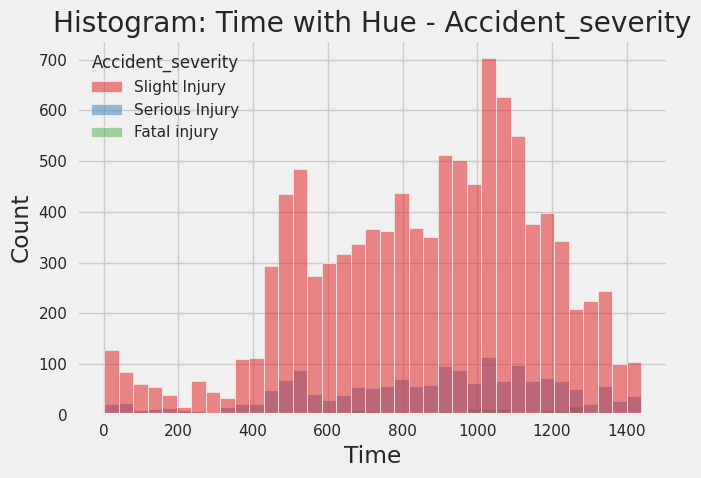

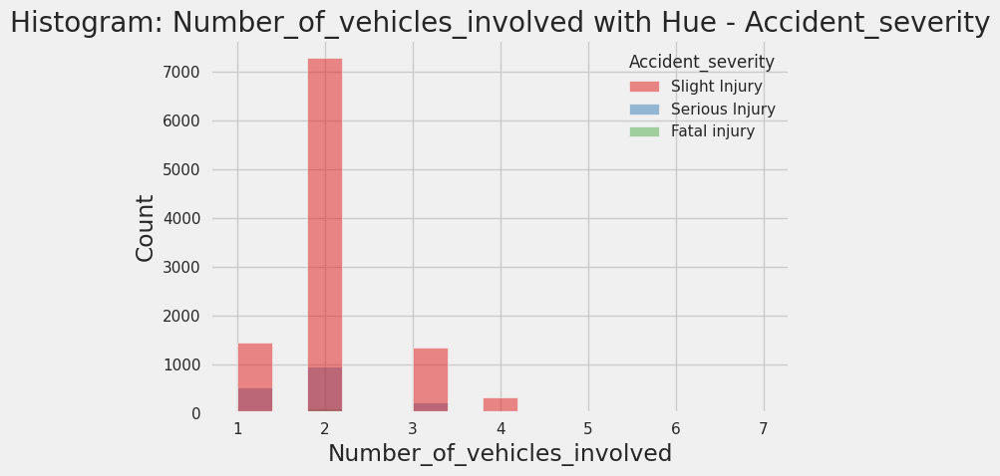

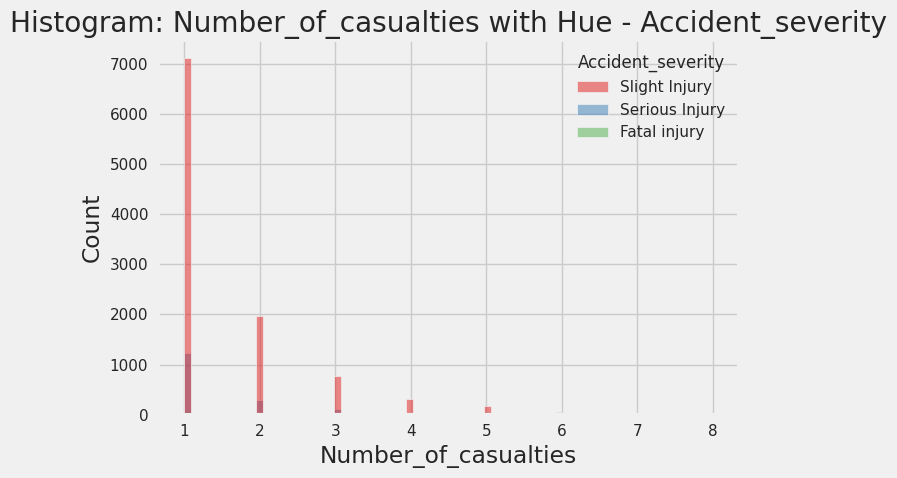

In [86]:
regression_columns = df2.columns[df2.dtypes != 'object'].tolist()

num_columns = len(regression_columns)

# Create histograms for each regression column
for i, column in enumerate(regression_columns):
    plt.figure(figsize=(7, 5))  # Adjust the figure size if needed

    sns.histplot(data=df2, x=column, hue=target)
    plt.title(f'Histogram: {column} with Hue - {target}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.tight_layout()  # Adjust the spacing between subplots
    plt.show()


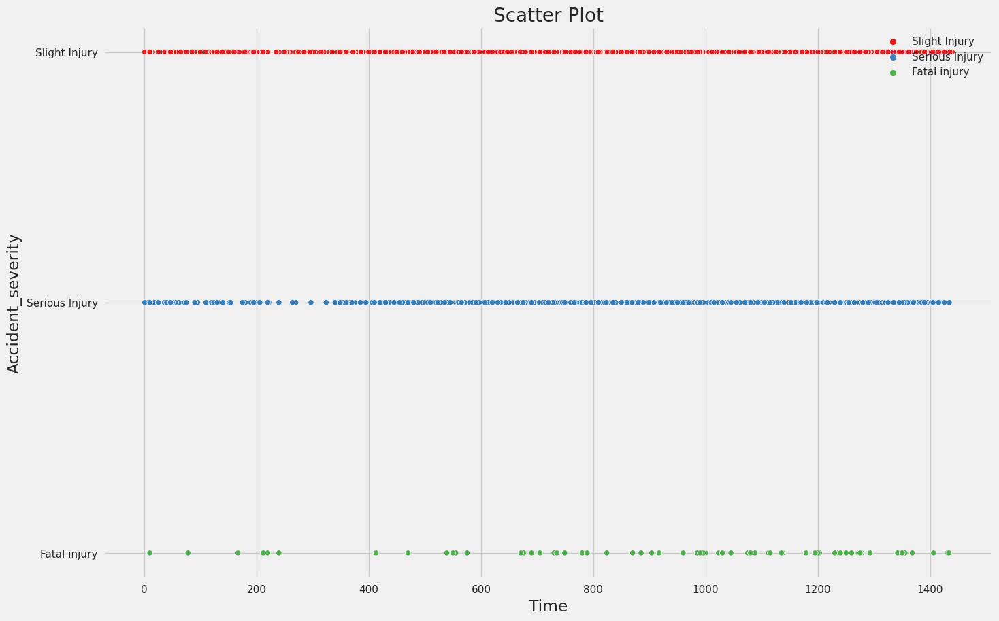

In [102]:
# Scatter plot
plt.figure(figsize=(15,10))
sns.scatterplot(data=df2, x='Time', y=target, hue=target)
plt.xlabel('Time')
plt.ylabel(target)
plt.legend(loc='upper right')
plt.title('Scatter Plot')
plt.show()

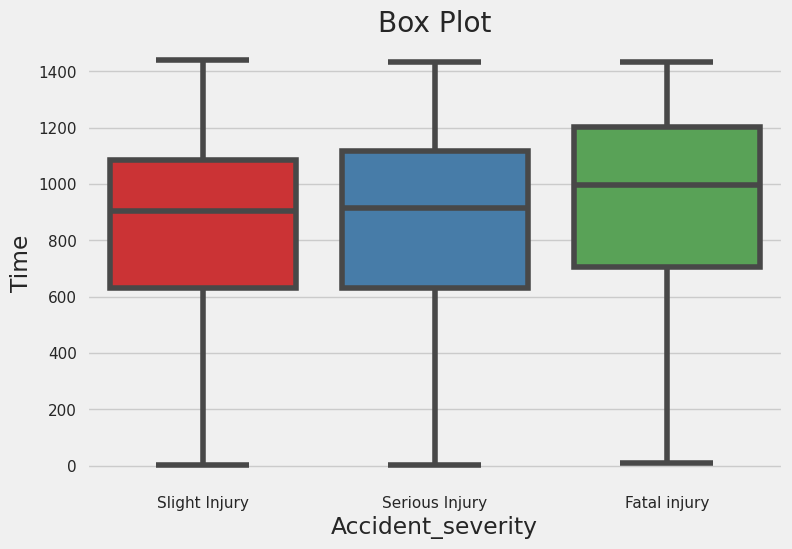

In [89]:
# Box Plot
sns.boxplot(data=df2, x=target, y='Time')
plt.xlabel(target)
plt.ylabel('Time')
plt.title('Box Plot')
plt.show()

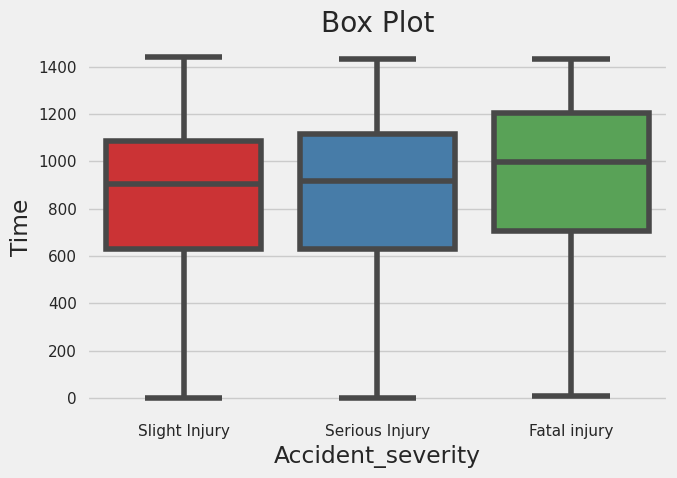

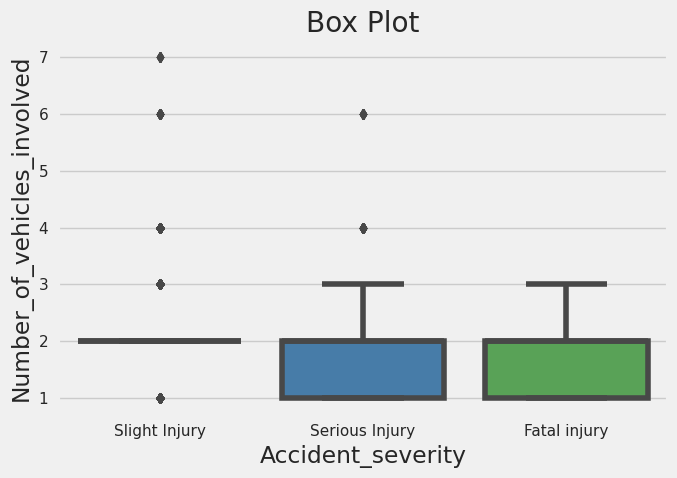

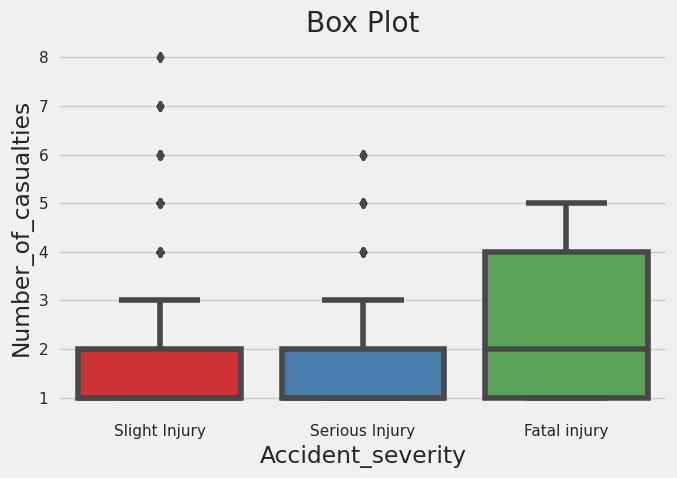

In [90]:
regression_columns = df2.columns[df2.dtypes != 'object'].tolist()

num_columns = len(regression_columns)

# Create histograms for each regression column
for i, column in enumerate(regression_columns):
    plt.figure(figsize=(7, 5))  # Adjust the figure size if needed

    sns.boxplot(data=df2, x=target, y=column)
    plt.xlabel(target)
    plt.ylabel(column)
    plt.title('Box Plot')
    plt.tight_layout()  # Adjust the spacing between subplots
    plt.show()

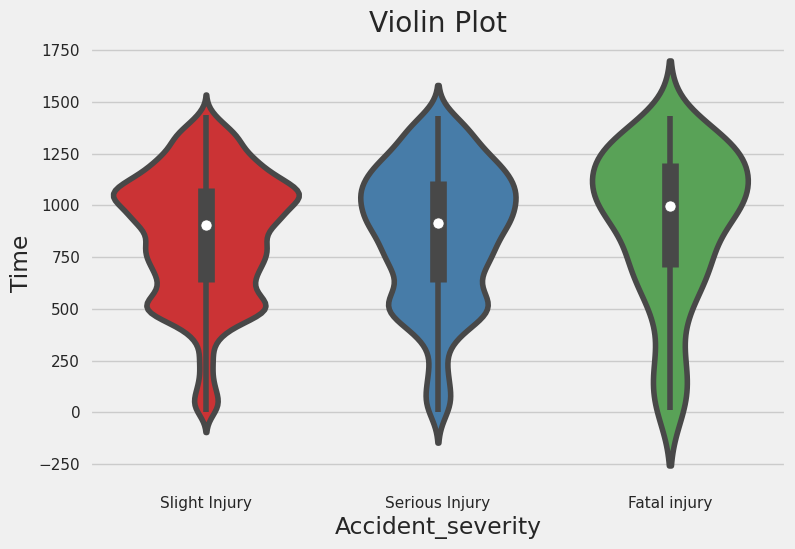

In [92]:
# Violin Plot
sns.violinplot(data=df2, x=target, y='Time')
plt.xlabel(target)
plt.ylabel('Time')
plt.title('Violin Plot')
plt.show()

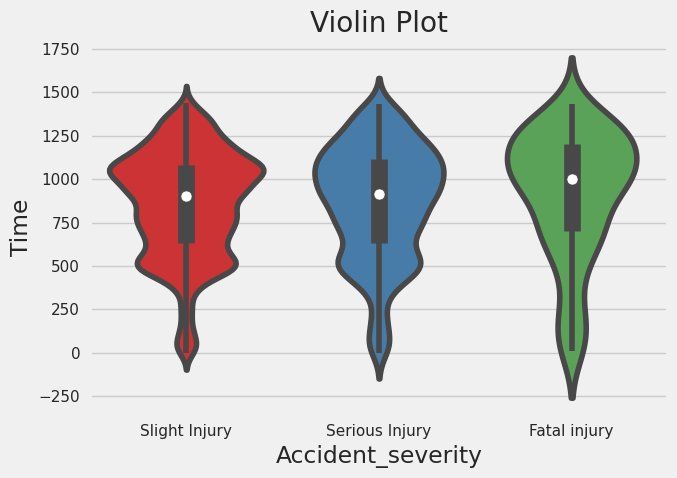

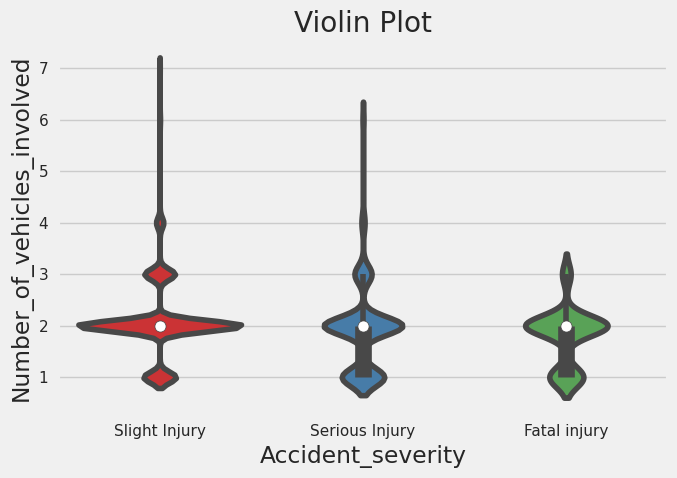

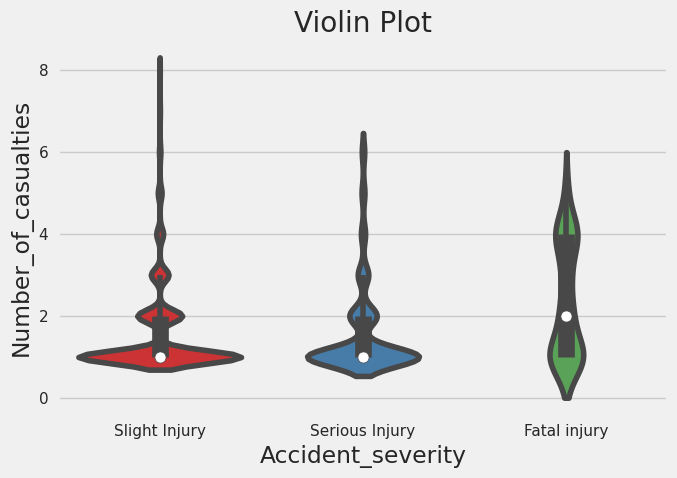

In [93]:
regression_columns = df2.columns[df2.dtypes != 'object'].tolist()

num_columns = len(regression_columns)

# Create histograms for each regression column
for i, column in enumerate(regression_columns):
    plt.figure(figsize=(7, 5))  # Adjust the figure size if needed

    sns.violinplot(data=df2, x=target, y=column)
    plt.xlabel(target)
    plt.ylabel(column)
    plt.title('Violin Plot')
    plt.tight_layout()  # Adjust the spacing between subplots
    plt.show()

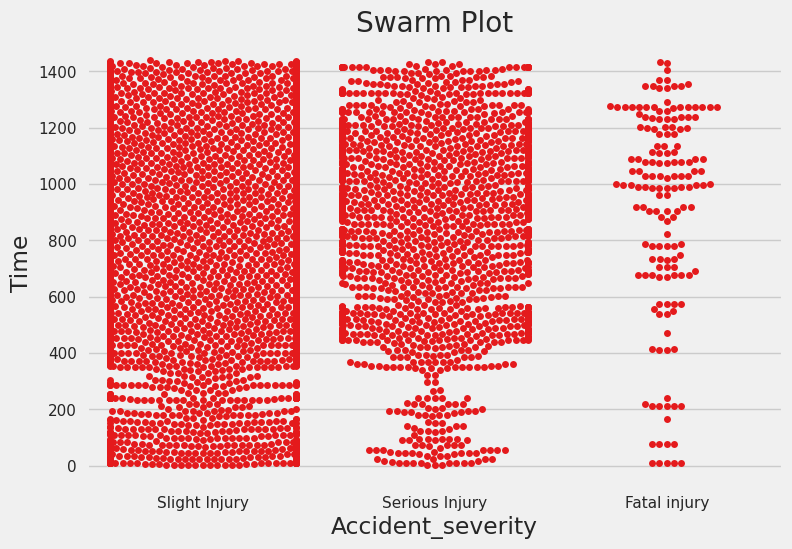

In [94]:
# Swarm Plot
sns.swarmplot(data=df2, x=target, y='Time')
plt.xlabel(target)
plt.ylabel('Time')
plt.title('Swarm Plot')
plt.show()

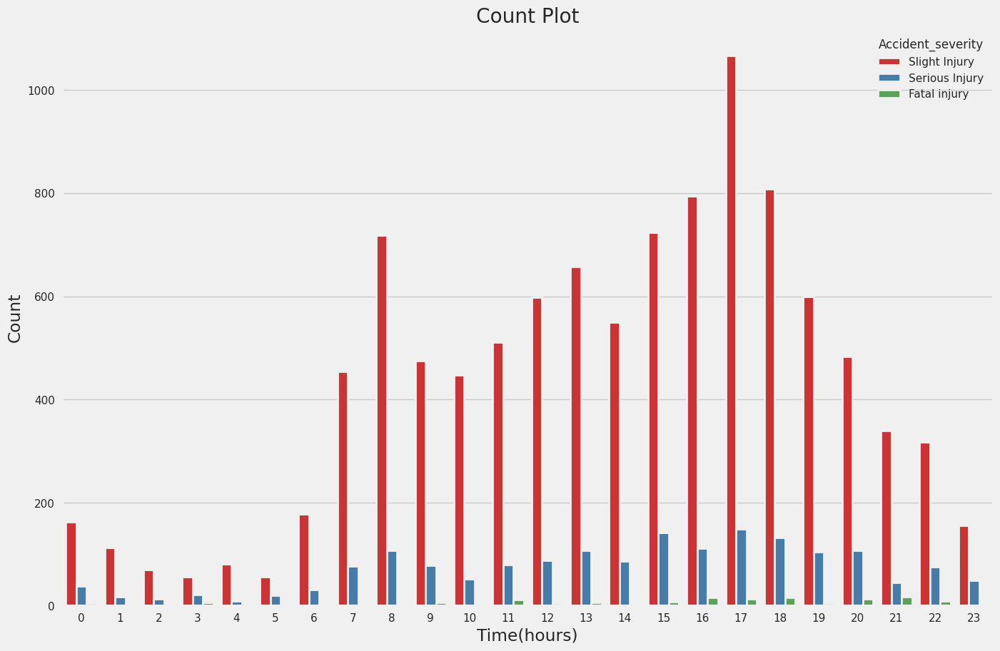

In [101]:
plt.figure(figsize=(15,10))
sns.countplot(data=df2, x=df2['Time']//60, hue=target, linewidth=2)
plt.xlabel('Time(hours)')
plt.ylabel('Count')
plt.title('Count Plot')
plt.show()